In [31]:
import numpy as np
import pandas as pd
from sklearn.linear_model import HuberRegressor
from pathlib import Path
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
from math import ceil
import os

In [15]:
os.getcwd()

'/Volumes/Science_SSD/Dissertation'

# SWOT

In [9]:
# ---------- originals ----------
def compute_aic(rss, n, k):
    return n * np.log(rss / n) + 2 * k

def fixed_huber_fit(X, y):
    model = HuberRegressor(epsilon=1.345, max_iter=500)
    model.fit(X, y)
    y_pred = model.predict(X)
    residuals = y - y_pred
    return model, y_pred, residuals

# ---------- extras for SWOT ----------
def _bootstrap_slope_huber(x, y, n_boot=0, random_state=42):
    """
    Optional bootstrap for SWOT slope uncertainty (Huber).
    Returns (ci_low, ci_high, se). If n_boot <= 0 or too few obs -> NaNs.
    """
    if n_boot is None or n_boot <= 0 or len(x) < 3:
        return np.nan, np.nan, np.nan
    rng = np.random.default_rng(random_state)
    n = len(x)
    X = x.reshape(-1, 1)
    slopes = []
    for _ in range(n_boot):
        idx = rng.integers(0, n, size=n)
        try:
            m, _, _ = fixed_huber_fit(X[idx], y[idx])
            slopes.append(float(m.coef_[0]))
        except Exception:
            continue
    if len(slopes) < max(10, n_boot // 10):
        return np.nan, np.nan, np.nan
    slopes = np.asarray(slopes, float)
    lo, hi = np.nanpercentile(slopes, [2.5, 97.5])
    se = float(np.nanstd(slopes, ddof=1))
    return float(lo), float(hi), se

def apply_fixed_huber_simple_to_dataframe_swot(
    df: pd.DataFrame,
    min_obs: int = 3,
    min_valid_slope: float = 0.0,
    n_boot_slope: int = 0,      # >0 to compute 95% CI via bootstrap
    random_state_boot: int = 42
) -> pd.DataFrame:
    """
    SWOT fitter: ONE Huber line per node_id (no breakpoints) + diagnostics.
    Input df must contain: ['node_id','width','wse'].

    Appends per-node SWOT fields:
      slope_swot, intercept_swot, AIC_swot, model_type_swot='simple'
      rho_swot, pval_swot
      rmse_swot, mae_swot, rss_swot, n_obs_swot
      swot_ci_low, swot_ci_high, swot_slope_se  (if n_boot_slope > 0)

    Returns the original rows with these columns merged on node_id.
    """
    req = {'node_id', 'width', 'wse'}
    if not req.issubset(df.columns):
        raise KeyError(f"Input DataFrame must contain: {req}")

    base = df.copy()
    base['width'] = pd.to_numeric(base['width'], errors='coerce')
    base['wse']   = pd.to_numeric(base['wse'],   errors='coerce')

    rows = []
    for nid, g in base.dropna(subset=['node_id']).groupby('node_id'):
        g = g.dropna(subset=['width', 'wse'])
        x = g['width'].to_numpy()
        y = g['wse'].to_numpy()
        n = len(x)

        out = {
            'node_id': nid,
            'slope_swot': np.nan, 'intercept_swot': np.nan,
            'AIC_swot': np.nan, 'model_type_swot': 'simple',
            'rho_swot': np.nan, 'pval_swot': np.nan,
            'rmse_swot': np.nan, 'mae_swot': np.nan, 'rss_swot': np.nan,
            'n_obs_swot': int(n) if np.isfinite(n) else np.nan,
            'swot_ci_low': np.nan, 'swot_ci_high': np.nan, 'swot_slope_se': np.nan,
        }

        # Basic guards
        if n < min_obs or float(np.ptp(x)) == 0.0:
            rows.append(out)
            continue

        # Spearman (width vs WSE)
        try:
            rho, pval = spearmanr(x, y)
            out['rho_swot'] = float(rho)
            out['pval_swot'] = float(pval)
        except Exception:
            pass

        # Huber regression
        try:
            model, yhat, res = fixed_huber_fit(x.reshape(-1, 1), y)
            slope = float(model.coef_[0])
            intercept = float(model.intercept_)
            if (not np.isfinite(slope)) or (slope < min_valid_slope):
                rows.append(out); continue

            rss = float(np.sum((y - yhat) ** 2))
            aic = compute_aic(rss, n, 2)

            out['slope_swot'] = slope
            out['intercept_swot'] = intercept
            out['rss_swot'] = rss
            out['AIC_swot'] = aic
            out['rmse_swot'] = float(np.sqrt(rss / n))
            out['mae_swot']  = float(np.mean(np.abs(y - yhat)))

            # Optional bootstrap CI for slope
            if n_boot_slope and n_boot_slope > 0:
                lo, hi, se = _bootstrap_slope_huber(x, y, n_boot=n_boot_slope, random_state=random_state_boot)
                out['swot_ci_low'] = lo
                out['swot_ci_high'] = hi
                out['swot_slope_se'] = se

        except Exception:
            pass

        rows.append(out)

    node_reg = pd.DataFrame(rows)

    # Ensure SWOT columns exist in base before merge (avoid duplicate names)
    swot_cols = [
        'slope_swot','intercept_swot','AIC_swot','model_type_swot',
        'rho_swot','pval_swot','rmse_swot','mae_swot','rss_swot','n_obs_swot',
        'swot_ci_low','swot_ci_high','swot_slope_se'
    ]
    for c in swot_cols:
        if c not in base.columns:
            base[c] = np.nan

    # Overwrite SWOT fields with fresh per-node results
    merged = (
        base.drop(columns=swot_cols, errors='ignore')
            .merge(node_reg, on='node_id', how='left')
    )
    return merged

def save_simple_huber_csv_swot(
    input_csv: str | Path,
    output_csv: str | Path,
    min_obs: int = 3,
    min_valid_slope: float = 0.0,
    n_boot_slope: int = 0,
    random_state_boot: int = 42
):
    df = pd.read_csv(input_csv)
    out = apply_fixed_huber_simple_to_dataframe_swot(
        df,
        min_obs=min_obs,
        min_valid_slope=min_valid_slope,
        n_boot_slope=n_boot_slope,
        random_state_boot=random_state_boot
    )
    Path(output_csv).parent.mkdir(parents=True, exist_ok=True)
    out.to_csv(output_csv, index=False)


In [17]:
save_simple_huber_csv_swot(
    input_csv="/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Binary_Masks/Sacramento/Bath_widths.csv",
    output_csv="/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Binary_Masks/Sacramento_bath_reg_bottom_error_simple.csv",
    min_obs=10,             # skip nodes with <3 obs
    min_valid_slope=0.0001,   # ignore negative slopes
    n_boot_slope=500       # number of bootstrap reps for CI (set 0 to skip)
)

# Bathymetry

In [32]:
from __future__ import annotations
# ---------- helpers ----------
def compute_aic(rss, n, k):
    return n * np.log(rss / n) + 2 * k

def fixed_huber_fit(X, y):
    model = HuberRegressor(epsilon=1.345, max_iter=500)
    model.fit(X, y)
    y_pred = model.predict(X)
    residuals = y - y_pred
    return model, y_pred, residuals

def _bootstrap_slope_huber(x, y, n_boot=0, random_state=42):
    """
    Bootstrap para incertidumbre de pendiente (Huber).
    Devuelve (ci_low, ci_high, se). Si n_boot<=0 o pocos datos -> NaNs.
    """
    if n_boot is None or n_boot <= 0 or len(x) < 3:
        return np.nan, np.nan, np.nan
    rng = np.random.default_rng(random_state)
    n = len(x)
    X = x.reshape(-1, 1)
    slopes = []
    for _ in range(n_boot):
        idx = rng.integers(0, n, size=n)
        try:
            m, _, _ = fixed_huber_fit(X[idx], y[idx])
            slopes.append(float(m.coef_[0]))
        except Exception:
            continue
    if len(slopes) < max(10, n_boot // 10):
        return np.nan, np.nan, np.nan
    slopes = np.asarray(slopes, float)
    lo, hi = np.nanpercentile(slopes, [2.5, 97.5])
    se = float(np.nanstd(slopes, ddof=1))
    return float(lo), float(hi), se

# ---------- adaptive coarsening (SWOT-like) ----------
def _coarsen_by_width_adaptive(
    x, y,
    target_res_m: float,
    min_pts_per_bin: int = 3,
    min_bins_kept: int = 2,
    max_bw_mult: float = 5.0,
):
    """
    Start at bin_size = target_res_m; inflate by ×1.6 until we keep
    ≥ min_bins_kept bins (each with ≥ min_pts_per_bin points), or reach target_res_m*max_bw_mult.
    Returns (xc, yc, eff_res_m, n_bins_kept); fails -> ([], [], nan, 0).
    """
    if target_res_m is None or target_res_m <= 0:
        return np.asarray(x, float), np.asarray(y, float), np.nan, 0

    x = np.asarray(x, float); y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return np.array([]), np.array([]), np.nan, 0

    xmin, xmax = np.nanmin(x), np.nanmax(x)
    if not np.isfinite(xmin) or not np.isfinite(xmax) or xmax <= xmin:
        return np.array([]), np.array([]), np.nan, 0

    bin_size = float(target_res_m)
    for _ in range(8):
        nbins = max(1, int(np.ceil((xmax - xmin) / bin_size)))
        edges = xmin + np.arange(nbins + 1) * bin_size
        idx = np.digitize(x, edges) - 1
        xc, yc = [], []
        for b in range(nbins):
            sel = (idx == b)
            if sel.sum() >= min_pts_per_bin:
                xc.append(np.nanmean(x[sel])); yc.append(np.nanmean(y[sel]))
        if len(xc) >= min_bins_kept:
            return np.asarray(xc), np.asarray(yc), bin_size, len(xc)
        if bin_size >= target_res_m * max_bw_mult:
            break
        bin_size *= 1.6

    return np.array([]), np.array([]), np.nan, 0

# ---------- core: BATHY only (SWOT-comparable) ----------
def apply_fixed_huber_simple_to_dataframe_bathy(
    df: pd.DataFrame,
    min_obs: int = 3,
    min_valid_slope: float = 0.0,
    n_boot_slope: int = 0,
    random_state_boot: int = 42,
    # SWOT comparability
    target_res_m: float | None = None,   # e.g., 20, 40, 60, 80; None=no coarsen
    min_span_mult: float = 2.0,          # need span ≥ min_span_mult * eff_res_m
    min_pts_per_bin: int = 3,
    min_bins_kept: int = 2,
    max_bw_mult: float = 5.0,
    k_detect_pixels: float = 2.0         # SWOT needs ~k pixels horizontal run
) -> pd.DataFrame:
    """
    Fit 1-line Huber per node on BATHY width–WSE and enforce SWOT-like scale via adaptive coarsening.
    Adds detectability s_max_swot and capped slope slope_bathy_swotcap.
    Input df must have: ['node_id','width','wse'] (bathymetry-derived).
    """
    req = {'node_id', 'width', 'wse'}
    if not req.issubset(df.columns):
        raise KeyError(f"Input DataFrame must contain: {req}")

    base = df.copy()
    base['width'] = pd.to_numeric(base['width'], errors='coerce')
    base['wse']   = pd.to_numeric(base['wse'],   errors='coerce')

    rows = []
    for nid, g in base.dropna(subset=['node_id']).groupby('node_id'):
        g = g.dropna(subset=['width', 'wse'])
        x_raw = g['width'].to_numpy(float)
        y_raw = g['wse'].to_numpy(float)
        n_raw = len(x_raw)

        out = dict(
            node_id=nid,
            slope_bathy=np.nan, intercept_bathy=np.nan,
            AIC_bathy=np.nan, model_type_bathy='simple',
            rho_bathy=np.nan, pval_bathy=np.nan,
            rmse_bathy=np.nan, mae_bathy=np.nan, rss_bathy=np.nan,
            n_obs_bathy=int(n_raw) if np.isfinite(n_raw) else np.nan,
            bath_ci_low=np.nan, bath_ci_high=np.nan, bath_slope_se=np.nan,
            # diagnostics
            eff_res_m=np.nan, coarsened_n=np.nan, n_bins_kept=np.nan, width_span_m=np.nan,
            resolved_for_swot=np.nan, s_max_swot=np.nan, slope_bathy_swotcap=np.nan
        )

        if n_raw < min_obs or float(np.ptp(x_raw)) == 0.0:
            rows.append(out); continue

        # choose series to fit (prefer coarsened if resolvable)
        used_coarsen = False
        x_use, y_use = x_raw, y_raw

        if target_res_m and target_res_m > 0:
            xc, yc, eff_res, n_kept = _coarsen_by_width_adaptive(
                x_raw, y_raw,
                target_res_m=float(target_res_m),
                min_pts_per_bin=int(min_pts_per_bin),
                min_bins_kept=int(min_bins_kept),
                max_bw_mult=float(max_bw_mult),
            )
            if xc.size >= 2:
                span = float(np.ptp(xc))
                out['eff_res_m']    = float(eff_res)
                out['coarsened_n']  = int(xc.size)
                out['n_bins_kept']  = int(n_kept)
                out['width_span_m'] = span
                # resolvability guard at *effective* bin size
                if span >= (min_span_mult * eff_res):
                    x_use, y_use = xc, yc
                    used_coarsen = True

        out['resolved_for_swot'] = bool(used_coarsen)

        # detectability limit with the series we will use
        dz = float(np.ptp(y_use)) if len(y_use) else np.nan
        eff_for_cap = float(out['eff_res_m']) if np.isfinite(out['eff_res_m']) else (float(target_res_m) if target_res_m else np.nan)
        if np.isfinite(dz) and np.isfinite(eff_for_cap) and eff_for_cap > 0:
            out['s_max_swot'] = dz / (k_detect_pixels * eff_for_cap)

        # --- Huber fit on chosen series ---
        x = np.asarray(x_use, float); y = np.asarray(y_use, float)
        m = np.isfinite(x) & np.isfinite(y)
        x, y = x[m], y[m]
        out['n_obs_bathy'] = int(len(x))
        if len(x) >= min_obs and float(np.ptp(x)) > 0.0:
            try:
                rho, pval = spearmanr(x, y)
                out['rho_bathy'] = float(rho); out['pval_bathy'] = float(pval)
            except Exception:
                pass
            try:
                model, yhat, res = fixed_huber_fit(x.reshape(-1, 1), y)
                slope = float(model.coef_[0]); intercept = float(model.intercept_)
                if np.isfinite(slope) and slope >= min_valid_slope:
                    rss = float(np.sum((y - yhat) ** 2))
                    out.update(
                        slope_bathy=slope,
                        intercept_bathy=intercept,
                        rss_bathy=rss,
                        AIC_bathy=compute_aic(rss, len(x), 2),
                        rmse_bathy=float(np.sqrt(rss / len(x))),
                        mae_bathy=float(np.mean(np.abs(y - yhat))),
                    )
                    if n_boot_slope and n_boot_slope > 0:
                        lo, hi, se = _bootstrap_slope_huber(x, y, n_boot=n_boot_slope, random_state=random_state_boot)
                        out.update(bath_ci_low=lo, bath_ci_high=hi, bath_slope_se=se)
            except Exception:
                pass

        # capped slope for SWOT comparability
        if np.isfinite(out['slope_bathy']) and np.isfinite(out['s_max_swot']):
            out['slope_bathy_swotcap'] = float(min(out['slope_bathy'], out['s_max_swot']))

        rows.append(out)

    node_reg = pd.DataFrame(rows)

    # ensure columns present in base before merge
    bath_cols = [
        'slope_bathy','intercept_bathy','AIC_bathy','model_type_bathy',
        'rho_bathy','pval_bathy','rmse_bathy','mae_bathy','rss_bathy','n_obs_bathy',
        'bath_ci_low','bath_ci_high','bath_slope_se',
        'eff_res_m','coarsened_n','n_bins_kept','width_span_m',
        'resolved_for_swot','s_max_swot','slope_bathy_swotcap'
    ]
    for c in bath_cols:
        if c not in base.columns:
            base[c] = np.nan

    merged = (
        base.drop(columns=bath_cols, errors='ignore')
            .merge(node_reg, on='node_id', how='left')
    )
    return merged

def save_simple_huber_csv_bathy(
    input_csv: str | Path,
    output_csv: str | Path,
    min_obs: int = 3,
    min_valid_slope: float = 0.0,
    n_boot_slope: int = 0,
    random_state_boot: int = 42,
    target_res_m: float | None = None,
    min_span_mult: float = 2.0,
    min_pts_per_bin: int = 3,
    min_bins_kept: int = 2,
    max_bw_mult: float = 5.0,
    k_detect_pixels: float = 2.0
):
    df = pd.read_csv(input_csv)
    out = apply_fixed_huber_simple_to_dataframe_bathy(
        df,
        min_obs=min_obs,
        min_valid_slope=min_valid_slope,
        n_boot_slope=n_boot_slope,
        random_state_boot=random_state_boot,
        target_res_m=target_res_m,
        min_span_mult=min_span_mult,
        min_pts_per_bin=min_pts_per_bin,
        min_bins_kept=min_bins_kept,
        max_bw_mult=max_bw_mult,
        k_detect_pixels=k_detect_pixels
    )
    Path(output_csv).parent.mkdir(parents=True, exist_ok=True)
    out.to_csv(output_csv, index=False)

In [ ]:
save_simple_huber_csv_bathy(
    input_csv="/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Binary_Masks/Garonne/Bath_widths.csv",
    output_csv="/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Binary_Masks/Garonne/bathy_reg_bottom_error_simple_20.csv",
    min_obs=10,
    min_valid_slope=1e-4,
    n_boot_slope=500,
    target_res_m=20,     # enforce ~80 m effective resolution
    min_span_mult=2.0,   # need ≥160 m width span after coarsen
    min_pts_per_bin=3,
    min_bins_kept=2,     # allow sparse nodes to survive
    k_detect_pixels=2.0
)


# Plots

In [ ]:
# ----------------- column helpers -----------------
def _prefix_cols(kind: str):
    """Column mapping for 'swot' or 'bathy'."""
    if kind.lower() == "swot":
        return dict(
            slope="slope_swot",
            intercept="intercept_swot",
            ci_low="swot_ci_low",
            ci_high="swot_ci_high",
            rho="rho_swot",
            rmse="rmse_swot",
            nobs="n_obs_swot",
            model="model_type_swot",
        )
    elif kind.lower() == "bathy":
        return dict(
            slope="slope_bathy",
            intercept="intercept_bathy",
            ci_low="bath_ci_low",
            ci_high="bath_ci_high",
            rho="rho_bathy",
            rmse="rmse_bathy",
            nobs="n_obs_bathy",
            model="model_type_bathy",
        )
    else:
        raise ValueError("kind must be 'swot' or 'bathy'")

def _pick_nodes(df: pd.DataFrame, n: int, nobs_col: str, nodes: Optional[Iterable]=None, random_state: int=42):
    """Choose node_ids to plot (prefer highest nobs)."""
    if nodes is not None:
        return list(nodes)
    rng = np.random.default_rng(random_state)
    if nobs_col in df.columns:
        per = df.groupby("node_id", as_index=False)[nobs_col].first()
        per = per.dropna(subset=[nobs_col]).sort_values(nobs_col, ascending=False)
        chosen = per["node_id"].head(n).tolist()
        if len(chosen) < n:
            rest = list(set(df["node_id"]) - set(chosen))
            if rest:
                chosen += list(rng.choice(rest, size=min(n-len(chosen), len(rest)), replace=False))
        return chosen[:n]
    unique_nodes = df["node_id"].dropna().unique()
    if len(unique_nodes) <= n:
        return list(unique_nodes)
    return list(rng.choice(unique_nodes, size=n, replace=False))

def _safe_num(v):
    try:
        return float(v)
    except Exception:
        return np.nan

def _sigfig(x, sig=2):
    if not np.isfinite(x):
        return "nan"
    if x == 0:
        return "0"
    return f"{x:.{sig}g}"

# ----------------- optional scatter coarsening -----------------
def _coarsen_by_width(x, y, bin_size_m=40.0, min_pts_per_bin=3):
    """
    Bin x (width) with fixed bin_size_m; average (x, y) within bins.
    Only keep bins with >= min_pts_per_bin points.
    """
    if bin_size_m is None or bin_size_m <= 0:
        return x, y
    x = np.asarray(x, float); y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x = x[m]; y = y[m]
    if x.size == 0:
        return x, y
    xmin, xmax = np.nanmin(x), np.nanmax(x)
    if not np.isfinite(xmin) or not np.isfinite(xmax) or xmax <= xmin:
        return np.array([]), np.array([])
    nbins = max(1, int(np.ceil((xmax - xmin) / bin_size_m)))
    edges = xmin + np.arange(nbins + 1) * bin_size_m
    idx = np.digitize(x, edges) - 1
    xc, yc = [], []
    for b in range(nbins):
        sel = (idx == b)
        if sel.sum() >= min_pts_per_bin:
            xc.append(np.nanmean(x[sel]))
            yc.append(np.nanmean(y[sel]))
    return np.asarray(xc), np.asarray(yc)

# ----------------- main plotter -----------------
def plot_regression_grid(
    df: pd.DataFrame,
    kind: str = "swot",
    nodes: Optional[Iterable] = None,
    n: int = 12,
    ncols: int = 4,
    ci_band: bool = True,
    x_label: str = "Width",
    y_label: str = "WSE",
    title: Optional[str] = None,
    random_state: int = 42,
    figsize_per_panel: tuple = (4.0, 3.4),
    scatter_kwargs: dict = None,
    line_kwargs: dict = None,
    ci_alpha: float = 0.18,
    # --- options ---
    loglog: bool = False,
    sig: int = 2,
    coarsen_to: float | str | None = None,  # None | number | "auto"
    min_pts_per_bin: int = 3,
    # internal: allow swapping the column mapping
    _prefix_override: Optional[Callable[[], dict]] = None,
):
    """
    Grid of node-level width vs WSE scatter + stored regression line.

    - If you computed bathy with SWOT-like scaling (target_res_m),
      the stored slope/intercept already reflect that; the line will match.
    - Set coarsen_to="auto" (and ensure df has 'eff_res_m' per node) to
      coarsen the scatter visually to each node's effective resolution.
      Or set a fixed number, e.g., coarsen_to=40, or leave None for raw points.
    - For plotting capped bathy slopes, use plot_bathy_grid(..., use_capped=True).
    """
    cols = _prefix_override() if _prefix_override else _prefix_cols(kind)
    need_cols = ["node_id", "width", "wse", cols["slope"], cols["intercept"]]
    for c in need_cols:
        if c not in df.columns:
            raise ValueError(f"Missing required column '{c}' for kind={kind}")

    scatter_kwargs = scatter_kwargs or dict(s=18, alpha=0.8, edgecolor="k", linewidths=0.3)
    line_kwargs = line_kwargs or dict(lw=2)

    node_list = _pick_nodes(df, n=n, nobs_col=cols["nobs"], nodes=nodes, random_state=random_state)
    if len(node_list) == 0:
        raise ValueError("No nodes available to plot.")

    n_panels = len(node_list)
    nrows = int(np.ceil(n_panels / ncols))
    fig_w = figsize_per_panel[0] * ncols
    fig_h = figsize_per_panel[1] * nrows
    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), squeeze=False)

    have_ci = ci_band and (cols["ci_low"] in df.columns) and (cols["ci_high"] in df.columns)

    for i, nid in enumerate(node_list):
        r, c = divmod(i, ncols)
        ax = axes[r, c]

        g = df[df["node_id"] == nid]
        x_raw = pd.to_numeric(g["width"], errors="coerce").to_numpy()
        y_raw = pd.to_numeric(g["wse"], errors="coerce").to_numpy()

        # --- coarsen scatter (optional) ---
        bin_size = None
        if coarsen_to is not None:
            if isinstance(coarsen_to, (int, float, np.floating)):
                bin_size = float(coarsen_to)
            elif isinstance(coarsen_to, str) and coarsen_to.lower() == "auto":
                if "eff_res_m" in g.columns:
                    bin_size = _safe_num(g["eff_res_m"].iloc[0])
        if bin_size and np.isfinite(bin_size) and bin_size > 0:
            x, y = _coarsen_by_width(x_raw, y_raw, bin_size_m=bin_size, min_pts_per_bin=min_pts_per_bin)
            # If coarsen results are empty, fall back to raw just for plotting
            if x.size == 0:
                x, y = x_raw, y_raw
        else:
            x, y = x_raw, y_raw

        # filter for log–log if requested
        m = np.isfinite(x) & np.isfinite(y)
        if loglog:
            m &= (x > 0) & (y > 0)
        x, y = x[m], y[m]

        slope = _safe_num(g[cols["slope"]].iloc[0]) if not g.empty else np.nan
        intercept = _safe_num(g[cols["intercept"]].iloc[0]) if not g.empty else np.nan
        rho = _safe_num(g[cols["rho"]].iloc[0]) if cols["rho"] in g.columns and not g.empty else np.nan
        rmse = _safe_num(g[cols["rmse"]].iloc[0]) if cols["rmse"] in g.columns and not g.empty else np.nan
        nobs = g[cols["nobs"]].iloc[0] if cols["nobs"] in g.columns and not g.empty else len(g)
        model = g[cols["model"]].iloc[0] if cols["model"] in g.columns and not g.empty else "simple"

        # scatter
        ax.scatter(x, y, **scatter_kwargs)

        # regression line + CI (line uses observed x-range)
        if np.isfinite(slope) and np.isfinite(intercept):
            if x.size >= 2:
                x_min, x_max = float(np.nanmin(x)), float(np.nanmax(x))
                pad = 0.04 * max(1e-9, (x_max - x_min))
                xx = np.linspace(x_min - pad, x_max + pad, 100)
            else:
                xx = np.linspace(np.nanmin(x_raw), np.nanmax(x_raw), 100)

            yy = intercept + slope * xx
            ax.plot(xx, yy, **line_kwargs)

            if have_ci:
                lo = _safe_num(g[cols["ci_low"]].iloc[0]); hi = _safe_num(g[cols["ci_high"]].iloc[0])
                if np.isfinite(lo) and np.isfinite(hi):
                    yy_lo = intercept + lo * xx
                    yy_hi = intercept + hi * xx
                    ax.fill_between(xx, yy_lo, yy_hi, alpha=ci_alpha)

        # axes scaling
        if loglog:
            ax.set_xscale("log"); ax.set_yscale("log")

        # per-panel title
        ax.set_title(
            f"node {nid} | {kind.upper()}\n"
            f"model={model}, slope={_sigfig(slope, sig)}, ρ={_sigfig(rho, sig)}, RMSE={_sigfig(rmse, sig)}, n={int(nobs) if pd.notna(nobs) else len(g)}",
            fontsize=9
        )
        ax.set_xlabel(x_label, fontsize=9)
        ax.set_ylabel(y_label, fontsize=9)
        ax.tick_params(labelsize=8)

    # hide unused axes
    for j in range(i + 1, nrows * ncols):
        r, c = divmod(j, ncols)
        axes[r, c].axis("off")

    if title:
        fig.suptitle(title, fontsize=12, y=1.02)
        plt.tight_layout(rect=[0, 0, 1, 0.98])
    else:
        plt.tight_layout()

    return fig, axes

# ----------------- convenience wrappers -----------------
def plot_swot_grid(df: pd.DataFrame, **kwargs):
    """Plot width–WSE regressions for SWOT."""
    return plot_regression_grid(df, kind="swot", **kwargs)

def plot_bathy_grid(df: pd.DataFrame, use_capped: bool = False, **kwargs):
    """
    Plot width–WSE regressions for Bathymetry.
    - use_capped=True will plot slope_bathy_swotcap instead of slope_bathy (if present).
    - To visually match the SWOT-like resolution of each node, pass coarsen_to="auto"
      (requires 'eff_res_m' column in df).
    """
    if use_capped and "slope_bathy_swotcap" in df.columns:
        df = df.copy()
        df["slope_bathy_plot"] = df["slope_bathy_swotcap"]

        def _prefix_cols_bathy_capped():
            return dict(
                slope="slope_bathy_plot",
                intercept="intercept_bathy",
                ci_low="bath_ci_low",
                ci_high="bath_ci_high",
                rho="rho_bathy",
                rmse="rmse_bathy",
                nobs="n_obs_bathy",
                model="model_type_bathy",
            )

        return plot_regression_grid(df, kind="bathy", _prefix_override=_prefix_cols_bathy_capped, **kwargs)
    else:
        return plot_regression_grid(df, kind="bathy", **kwargs)

In [ ]:
df_swot = pd.read_csv("/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/Po/Po_reg_bottom_error_simple.csv")  # tu salida
# Un grid con 12 nodos (3x4), con banda de confianza si hay swot_ci_low/high:
fig, axes = plot_swot_grid(
    df_swot,
    n=12, ncols=4,
    ci_band=True,
    title="SWOT: Width vs WSE (Huber) con banda de confianza"
)

In [ ]:
df_bathy = pd.read_csv("/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Binary_Masks/Sacramento/Sacramento_bathy_reg_bottom_error_simple_40.csv")
fig, axes = plot_bathy_grid(
    df_bathy,
    n=20, ncols=4,
    ci_band=True,
    title="Bathy: Width vs WSE (Huber) con banda de confianza"
)

In [33]:
import glob, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LinearSegmentedColormap, BoundaryNorm, ListedColormap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib import patheffects as pe
import matplotlib as mpl
from matplotlib.patches import Rectangle
from matplotlib.path import Path
import matplotlib.transforms as mtransforms
from PIL import Image  # verify export size

✅ after filtering 36,006,101 rows


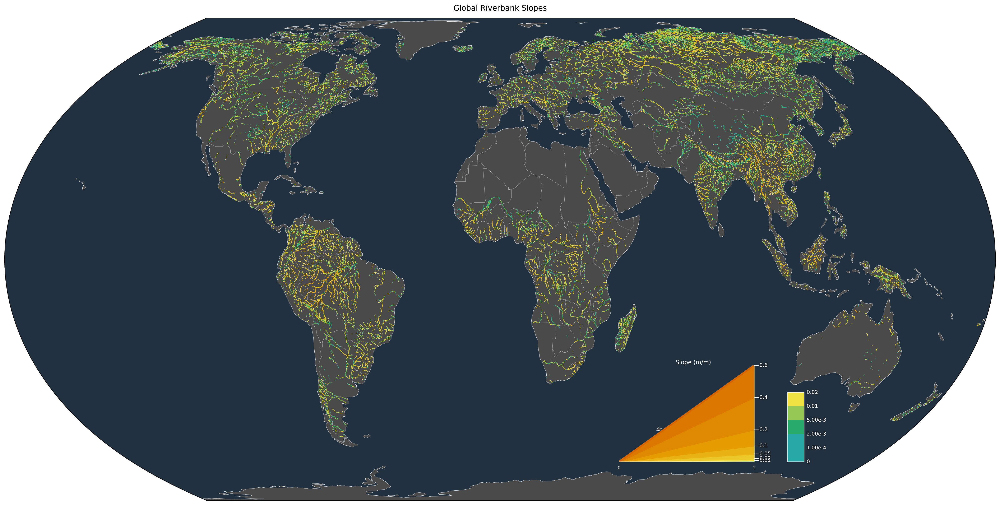

In [59]:
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------- CONFIG ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL    = "lat"
LON_COL    = "lon"
VAL_COL    = "slope1"

PROJ_NAME  = "equalearth"      # "equalearth" | "robinson"
FIGSIZE    = (22, 11)
POINT_SIZE = 0.35
ALPHA      = 0.9

# Filter plausible slopes
MIN_SLOPE  = 1e-4
MAX_SLOPE  = 1.0                # keep up to 1 m/m ≈ 45°

# Hybrid breaks (discrete classes) — includes top class 0.6–1.0
BREAKS = np.array([
    0.0001, 0.002, 0.005, 0.01, 0.02,
    0.05, 0.1, 0.2, 0.4, 0.6, 1.0
])

# ► Recommended triangle top based on histogram: 0.6
TRIANGLE_VMAX = 0.6             # set to 1.0 if you want the triangle to reach 1

# Legend placement
LEG_ANCHOR  = (0.62, 0.08)      # triangle lower-left (axes fraction)
LEG_SIZE    = (0.15, 0.20)
N_LEG_LINES = 240

# *** Contrast knob (keeps palette): sample gradient with gamma ***
COLOR_GAMMA = 0.65              # <1 boosts mid/high contrast; try 0.65..0.85
# -----------------------------------------

# Palette: Okabe–Ito continuous
def okabe_ito_cont():
    return LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9","#009E73","#F0E442","#E69F00","#D55E00"],
        N=256
    )
cmap_cont = okabe_ito_cont()

# Build discrete colors: one per bin, sampled with gamma (contrast)
n_bins = len(BREAKS) - 1
# evenly spaced bin centers → gamma-warped sample positions
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers, 0, 1) ** COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")

# Norm for the data/legend bins
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

# Projection
proj = ccrs.EqualEarth() if PROJ_NAME == "equalearth" else ccrs.Robinson()

# ---------------- Load data ----------------
files = sorted(glob.glob(CSV_GLOB))
if not files:
    raise FileNotFoundError("No CSVs found")

dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL,LON_COL,VAL_COL])
        dfs.append(df.dropna(subset=[LAT_COL,LON_COL,VAL_COL]))
    except Exception as e:
        print(f"⚠️ Skipped {f}: {e}")

data = pd.concat(dfs, ignore_index=True)
data = data[(data[VAL_COL]>=MIN_SLOPE) & (data[VAL_COL]<=MAX_SLOPE)].reset_index(drop=True)
vals = data[VAL_COL].to_numpy()
print(f"✅ after filtering {len(data):,} rows")

# ---------------- Figure ----------------
plt.figure(figsize=FIGSIZE, dpi=220, facecolor="none")
ax = plt.axes(projection=proj)
ax.set_global()
ax.set_facecolor("none")
ax.add_feature(cfeature.LAND,facecolor="#4a4a4a",edgecolor="none",zorder=0)
ax.add_feature(cfeature.OCEAN,facecolor="#22313f",edgecolor="none",zorder=0)
ax.coastlines("110m",linewidth=0.3,color="white",zorder=1)
ax.add_feature(cfeature.BORDERS,linewidth=0.25,edgecolor="lightgray",zorder=1)

ax.scatter(
    data[LON_COL], data[LAT_COL],
    c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
    transform=ccrs.PlateCarree(),
    linewidths=0, alpha=ALPHA, rasterized=True, zorder=2
)

# ---------------- Triangle legend ----------------
def fmt_lab(y: float)->str:
    if y==0: return "0"
    if y>=0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e=int(np.floor(np.log10(y))); sig=y/10**e
    return f"{sig:.2f}e{e}"

ax_leg=ax.inset_axes([LEG_ANCHOR[0],LEG_ANCHOR[1],LEG_SIZE[0],LEG_SIZE[1]],
                     transform=ax.transAxes,zorder=5)
ax_leg.set_facecolor((0,0,0,0))
for s in ax_leg.spines.values(): s.set_visible(False)

# Fan (value-true); limited to TRIANGLE_VMAX for readability
s0 = BREAKS[0]
for sv in np.linspace(s0, TRIANGLE_VMAX, N_LEG_LINES):
    ax_leg.plot([0,1],[0,sv],color=cmap(norm(sv)),lw=2.8,
                solid_capstyle="round",alpha=0.98,zorder=3)

ax_leg.plot([0,1],[0,0],color="white",lw=1,zorder=6)
ax_leg.plot([1,1],[0,TRIANGLE_VMAX],color="white",lw=1,zorder=6)

# Labels only where color changes; near vertex keep just 0.01 & 0.02
LOW_KEEP={0.01,0.02}
LABEL_TICKS=[b for b in BREAKS[1:] if (b<=TRIANGLE_VMAX and (b>=0.02 or b in LOW_KEEP))]
for b in LABEL_TICKS:
    ax_leg.hlines(b,1.0,1.035,colors="white",lw=1.0,zorder=7)
    ax_leg.text(1.04,b,fmt_lab(b),va="center",ha="left",fontsize=8,
                color="white",zorder=8,
                path_effects=[pe.Stroke(linewidth=2.5,foreground="black",alpha=0.25),pe.Normal()])

# base ticks
for x0,lab in [(0,"0"),(1,"1")]:
    ax_leg.vlines(x0,0,0,colors="white",lw=1)
    ax_leg.annotate(lab,xy=(x0,0),xycoords="data",
                    xytext=(0,-6),textcoords="offset points",
                    ha="center",va="top",fontsize=7,color="white")

ax_leg.set_xlim(0,1.1)
ax_leg.set_ylim(0,TRIANGLE_VMAX)
ax_leg.set_xticks([]); ax_leg.set_yticks([])
ax_leg.set_title("Slope (m/m)",fontsize=9,color="white",pad=2)

# ---------------- Low-end 0–0.02 bar (equal-height per color slice) ---------
LOW_MAX  = 0.02
GAP      = 0.02
BAR_W    = 0.022
BAR_H    = LEG_SIZE[1] * 0.72
BAR_LEFT = LEG_ANCHOR[0] + LEG_SIZE[0] + GAP
BAR_BOX  = (BAR_LEFT, LEG_ANCHOR[1], BAR_W, BAR_H)  # bottoms aligned

ax_bar=ax.inset_axes([BAR_BOX[0],BAR_BOX[1],BAR_BOX[2],BAR_BOX[3]],
                     transform=ax.transAxes,zorder=6)
ax_bar.set_facecolor((0,0,0,0))
for s in ax_bar.spines.values(): s.set_visible(False)

# Edges intersecting [0, LOW_MAX]; include 0 explicitly for the bar
low_edges = BREAKS[(BREAKS >= 0) & (BREAKS <= LOW_MAX)]
if 0.0 not in low_edges: low_edges = np.r_[0.0, low_edges]
low_edges = np.unique(low_edges)
if low_edges.size < 2: low_edges = np.array([0.0, LOW_MAX])

# Equal-height slices (one per color bin within 0–0.02)
low_bins  = list(zip(low_edges[:-1], low_edges[1:]))
n_low     = len(low_bins)
slice_h   = LOW_MAX / n_low

for i, (a, b) in enumerate(low_bins):
    cval  = 0.5*(a+b)
    y0    = i * slice_h
    ax_bar.add_patch(Rectangle((0, y0), 1.0, slice_h,
                               facecolor=cmap(norm(cval)), edgecolor='none', zorder=2))
    # one label per slice: show the UPPER EDGE value
    ax_bar.text(1.15, y0 + slice_h, fmt_lab(b), va="center", ha="left",
                fontsize=8, color="white", zorder=3,
                path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                              pe.Normal()])

# Bottom label "0" only
ax_bar.text(1.15, 0.0, "0", va="center", ha="left",
            fontsize=8, color="white", zorder=3,
            path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                          pe.Normal()])

# Frame
ax_bar.vlines([0,1], 0, LOW_MAX, colors="white", lw=0.8, zorder=3)
ax_bar.hlines([0, LOW_MAX], 0, 1, colors="white", lw=0.8, zorder=3)

ax_bar.set_xlim(0, 1.30)
ax_bar.set_ylim(0, LOW_MAX)
ax_bar.set_xticks([]); ax_bar.set_yticks([])

# ----------------
ax.set_title("Global Riverbank Slopes",
             pad=12, color="black")

plt.tight_layout()
plt.show()



✅ after filtering: 35,783,661 rows


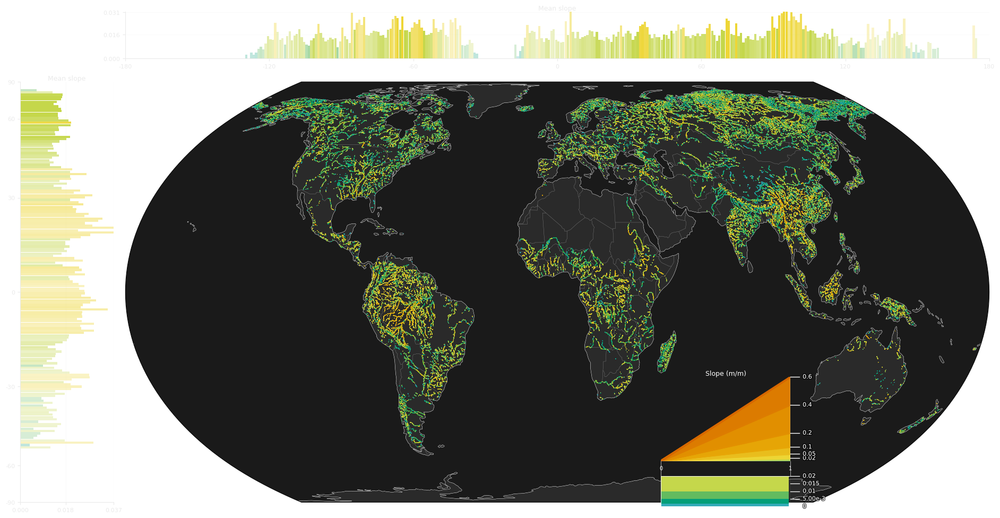

Expected size: 19800 x 9900 px


DecompressionBombError: Image size (196020000 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.

In [ ]:

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------- QGIS-like export settings ----------
EXPORT_DPI = 900
mpl.rcParams["savefig.dpi"] = EXPORT_DPI
mpl.rcParams['agg.path.chunksize'] = 20000

# ---------------- CONFIG ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL    = "lat";  LON_COL = "lon";  VAL_COL = "slope1"

PROJ_NAME  = "equalearth"      # "equalearth" | "robinson"
FIGSIZE    = (22, 11)
POINT_SIZE = 0.35
ALPHA      = 0.9

# Slope domain
MIN_SLOPE  = 1e-4
MAX_SLOPE  = 1.0

# Hybrid breaks for map + legend
BREAKS = np.array([0.0001, 0.002, 0.005, 0.01, 0.02,
                   0.05, 0.1, 0.2, 0.4, 0.6, 1.0])

TRIANGLE_VMAX = 0.6
LEG_ANCHOR  = (0.62, 0.08)       # triangle anchor (axes fraction)
LEG_SIZE    = (0.15, 0.20)       # triangle size (w, h)
N_LEG_LINES = 240
COLOR_GAMMA = 0.75

# ---- Projection-aware marginals ----
N_X_BINS   = 360
N_Y_BINS   = 180
MIN_COUNT_LON = 3
MIN_COUNT_LAT = 3

# Opacity scaling for bars based on counts
ALPHA_MIN = 0.25
ALPHA_MAX = 1.00
COUNT_LOW_Q  = 5
COUNT_HIGH_Q = 95

# Styling
BORDER_LW     = 0.0
TICK_COLOR    = "#EAEAEA"
GRID_ALPHA    = 0.15

# Axes layout (figure fractions)
MAP_AX   = [0.13, 0.12, 0.74, 0.72]
TOP_AX   = [0.13, 0.88, 0.74, 0.08]
LEFT_AX  = [0.04, 0.12, 0.08, 0.72]

# Low-end mini-bar domain
LOW_MAX  = 0.02

# ---------- Legend layout tuning ----------
TRIANGLE_Y_OFFSET = 0.018          # move triangle up a bit
BAR_Y_OFFSET      = 0.018          # move bar down a bit
BAR_UNDER_H_F     = 0.36           # bar height (fraction of triangle height)
N_LOW_SLICES      = 24             # evenly spaced slices in low-end bar
BAR_TICKS         = np.linspace(0.0, LOW_MAX, 5)  # 0, .005, .01, .015, .02

# SHARED right-column geometry drawn in the PARENT AXES (ax.transAxes)
TICK_STUB_AX = 0.010               # length of the tick stub to the right (axes fraction)
LABEL_PAD_AX = 0.004               # text padding past the tick stub (axes fraction)

# ----------------------------------------------

def okabe_ito_cont():
    return LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9","#009E73","#F0E442","#E69F00","#D55E00"],
        N=256
    )

cmap_cont = okabe_ito_cont()
n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers, 0, 1) ** COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

def fmt_lab(y: float)->str:
    if y==0: return "0"
    if y>=0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e=int(np.floor(np.log10(y))); sig=y/10**e
    return f"{sig:.2f}e{e}"

def alphas_from_counts(counts, a_min=ALPHA_MIN, a_max=ALPHA_MAX,
                       qlow=COUNT_LOW_Q, qhigh=COUNT_HIGH_Q):
    counts = np.asarray(counts, dtype=float)
    if counts.size == 0:
        return counts
    pos = counts[counts > 0]
    if pos.size == 0:
        return np.zeros_like(counts)
    lo = np.percentile(pos, qlow)
    hi = np.percentile(pos, qhigh)
    if hi <= lo:
        a = np.zeros_like(counts)
        a[counts > 0] = a_max
        return a
    a = (counts - lo) / (hi - lo)
    a = np.clip(a, 0, 1)
    return a_min + (a_max - a_min) * a

# ---------------- Load data ----------------
files = sorted(glob.glob(CSV_GLOB))
if not files:
    raise FileNotFoundError("No CSVs found")

dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL, LON_COL, VAL_COL])
        dfs.append(df.dropna(subset=[LAT_COL, LON_COL, VAL_COL]))
    except Exception as e:
        print(f"⚠️ Skipped {f}: {e}")

data = pd.concat(dfs, ignore_index=True)

# slope filter & normalize lon to (-180, 180]
data = data[(data[VAL_COL] >= MIN_SLOPE) & (data[VAL_COL] <= MAX_SLOPE)].copy()
data[LON_COL] = ((data[LON_COL] + 180) % 360) - 180
vals = data[VAL_COL].to_numpy()
print(f"✅ after filtering: {len(data):,} rows")

# ---------------- Figure & Map ----------------
proj = ccrs.EqualEarth() if PROJ_NAME=="equalearth" else ccrs.Robinson()
pc   = ccrs.PlateCarree()

fig = plt.figure(figsize=FIGSIZE, dpi=100, facecolor="none", edgecolor="none")
ax = fig.add_axes(MAP_AX, projection=proj)
ax.set_global()

ax.set_facecolor("none")
fig.patch.set_facecolor("none")

# Slightly lighter globe ellipse
ax.add_feature(cfeature.LAND,  facecolor="#2A2A2A", edgecolor="none", zorder=0)
ax.add_feature(cfeature.OCEAN, facecolor="#1A1A1A", edgecolor="none", zorder=0)
ax.coastlines("110m", linewidth=0.35, color="#DDDDDD", zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.25, edgecolor="#999999", zorder=1)

# scatter (map)
ax.scatter(
    data[LON_COL], data[LAT_COL],
    c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
    transform=pc,
    linewidths=0, alpha=ALPHA, rasterized=True, zorder=2
)

# ======================== LEGEND =========================
# Triangle inset
tri_left, tri_bot = LEG_ANCHOR[0], LEG_ANCHOR[1] + TRIANGLE_Y_OFFSET
tri_w, tri_h = LEG_SIZE
ax_leg = ax.inset_axes([tri_left, tri_bot, tri_w, tri_h],
                       transform=ax.transAxes, zorder=5)
ax_leg.set_facecolor("none")
for s in ax_leg.spines.values(): s.set_visible(False)

# Triangle coloring
for sv in np.linspace(BREAKS[0], TRIANGLE_VMAX, N_LEG_LINES):
    ax_leg.plot([0,1], [0,sv], color=cmap(norm(sv)), lw=2.8,
                solid_capstyle="round", alpha=0.98, zorder=3)
# Triangle outline
ax_leg.plot([0,1], [0,0], color="white", lw=1, zorder=6)
ax_leg.plot([1,1], [0,TRIANGLE_VMAX], color="white", lw=1, zorder=6)

# Base labels "0" and "1"
ax_leg.annotate("0", xy=(0,0), xycoords="data",
                xytext=(0,-6), textcoords="offset points",
                ha="center", va="top", fontsize=7, color="white")
ax_leg.annotate("1", xy=(1,0), xycoords="data",
                xytext=(0,-6), textcoords="offset points",
                ha="center", va="top", fontsize=7, color="white")

ax_leg.set_xlim(0,1.0); ax_leg.set_ylim(0,TRIANGLE_VMAX)
ax_leg.set_xticks([]); ax_leg.set_yticks([])
ax_leg.set_title("Slope (m/m)", fontsize=9, color="white", pad=2)

# Bar inset (0–0.02), same width, below triangle
bar_w = tri_w
bar_h = tri_h * BAR_UNDER_H_F
bar_left = tri_left
bar_bottom = LEG_ANCHOR[1] - BAR_Y_OFFSET - bar_h
ax_bar = ax.inset_axes([bar_left, bar_bottom, bar_w, bar_h],
                       transform=ax.transAxes, zorder=6)
ax_bar.set_facecolor("none")
for s in ax_bar.spines.values(): s.set_visible(False)

# Evenly spaced low-end colors (fill stops before shared tick column)
low_vals = np.linspace(0.0, LOW_MAX, N_LOW_SLICES+1)
slice_h = LOW_MAX / N_LOW_SLICES
fill_w = 1.0 - (TICK_STUB_AX + LABEL_PAD_AX)  # keep clear of shared column
for i in range(N_LOW_SLICES):
    a, b = low_vals[i], low_vals[i+1]
    cval = 0.5*(a+b)
    y0   = i*slice_h
    ax_bar.add_patch(Rectangle((0, y0), fill_w, slice_h,
                               facecolor=cmap(norm(cval)),
                               edgecolor=('white' if BORDER_LW>0 else 'none'),
                               linewidth=BORDER_LW, zorder=2))

# Frames (right edge at x=1 EXACTLY)
ax_bar.vlines([0,1], 0, LOW_MAX, colors="white", lw=0.8, zorder=3, alpha=0.85)
ax_bar.hlines([0, LOW_MAX], 0, 1, colors="white", lw=0.8, zorder=3, alpha=0.85)
ax_bar.set_xlim(0,1.0); ax_bar.set_ylim(0, LOW_MAX)
ax_bar.set_xticks([]); ax_bar.set_yticks([])

# --- SHARED right label column & tick stubs (drawn in parent ax) ---
# Shared x positions (in ax.transAxes)
x_right_edge = tri_left + tri_w
x_tick_tip   = x_right_edge + TICK_STUB_AX
x_text       = x_tick_tip + LABEL_PAD_AX

# Place tick/labels for the triangle (>= 0.02)
LABEL_TICKS_TRI = [b for b in BREAKS[1:] if (0.02 <= b <= TRIANGLE_VMAX)]
for yval in LABEL_TICKS_TRI:
    y_ax = tri_bot + (yval/TRIANGLE_VMAX)*tri_h   # convert to ax.transAxes y
    # tick stub
    ax.plot([x_right_edge, x_tick_tip], [y_ax, y_ax],
            transform=ax.transAxes, color="white", lw=1.0, zorder=7)
    # label
    ax.text(x_text, y_ax, fmt_lab(yval),
            transform=ax.transAxes, va="center", ha="left",
            fontsize=8, color="white",
            path_effects=[pe.Stroke(linewidth=2.5, foreground="black", alpha=0.6), pe.Normal()],
            zorder=8)

# Place tick/labels for the bar (0..0.02) — reuses SAME x positions
for yval in BAR_TICKS:
    y_ax = bar_bottom + (yval/LOW_MAX)*bar_h
    ax.plot([x_right_edge, x_tick_tip], [y_ax, y_ax],
            transform=ax.transAxes, color="white", lw=0.9, zorder=7)
    ax.text(x_text, y_ax, fmt_lab(yval),
            transform=ax.transAxes, va="center", ha="left",
            fontsize=8, color="white",
            path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.6), pe.Normal()],
            zorder=8)

# Thin “zoom” connector lines (from triangle baseline to bar top)
tri_base_y = tri_bot
bar_top_y  = bar_bottom + bar_h
ax.plot([tri_left,           bar_left],         [tri_base_y, bar_top_y],
        transform=ax.transAxes, color="white", lw=0.6, alpha=0.75, zorder=6)
ax.plot([tri_left + tri_w,   bar_left + bar_w], [tri_base_y, bar_top_y],
        transform=ax.transAxes, color="white", lw=0.6, alpha=0.75, zorder=6)

# ===================== Projection-aware marginals =========================
xy = proj.transform_points(pc, data[LON_COL].to_numpy(), data[LAT_COL].to_numpy())
xproj = xy[:, 0]; yproj = xy[:, 1]
valid = np.isfinite(xproj) & np.isfinite(yproj) & np.isfinite(vals)
xproj, yproj, vproj = xproj[valid], yproj[valid], vals[valid]

xmin, xmax = ax.get_xlim(); ymin, ymax = ax.get_ylim()

# ----- Longitude (projected X, top) -----
x_edges = np.linspace(xmin, xmax, N_X_BINS + 1)
x_cent  = 0.5 * (x_edges[:-1] + x_edges[1:])
x_idx   = np.digitize(xproj, x_edges, right=True) - 1
kx = len(x_edges) - 1
x_mean  = np.full(kx, np.nan)
x_count = np.zeros(kx, dtype=int)
for i in range(kx):
    m = (x_idx == i)
    if m.any():
        x_mean[i]  = np.nanmean(vproj[m])
        x_count[i] = m.sum()
mask_x = (x_count >= MIN_COUNT_LON) & np.isfinite(x_mean)
x_cent, x_mean, x_count = x_cent[mask_x], x_mean[mask_x], x_count[mask_x]
x_alpha = alphas_from_counts(x_count)

ax_top = fig.add_axes(TOP_AX)
ax_top.set_facecolor("none")
ymax_top = np.nanpercentile(x_mean, 99) if x_mean.size else 0.02
bar_w_top = (x_edges[1]-x_edges[0]) * 0.95
for xc, m, a in zip(x_cent, x_mean, x_alpha):
    ax_top.add_patch(Rectangle((xc - bar_w_top/2, 0), bar_w_top, m,
                               facecolor=cmap(norm(np.clip(m, BREAKS[0], BREAKS[-1]))),
                               edgecolor='none', alpha=a, zorder=2))
lon_ticks = np.arange(-180, 181, 60)
lon_tick_x = proj.transform_points(pc, lon_ticks, np.zeros_like(lon_ticks))[:,0]
ax_top.set_xlim(xmin, xmax); ax_top.set_ylim(0, ymax_top)
ax_top.set_xticks(lon_tick_x); ax_top.set_xticklabels([f"{ltg:d}" for ltg in lon_ticks], color=TICK_COLOR)
ax_top.set_yticks([0, round(ymax_top*0.5,3), round(ymax_top,3)])
ax_top.grid(axis="y", alpha=GRID_ALPHA, color=TICK_COLOR)
ax_top.tick_params(colors=TICK_COLOR, labelsize=8)
for sp in ["top","right"]: ax_top.spines[sp].set_visible(False)
ax_top.spines["bottom"].set_color(TICK_COLOR); ax_top.spines["left"].set_color(TICK_COLOR)
ax_top.set_title("Mean slope", color=TICK_COLOR, fontsize=9, pad=2)

# ----- Latitude (projected Y, left) -----
y_edges = np.linspace(ymin, ymax, N_Y_BINS + 1)
y_cent  = 0.5 * (y_edges[:-1] + y_edges[1:])
y_idx   = np.digitize(yproj, y_edges, right=True) - 1
ky = len(y_edges) - 1
y_mean  = np.full(ky, np.nan)
y_count = np.zeros(ky, dtype=int)
for i in range(ky):
    m = (y_idx == i)
    if m.any():
        y_mean[i]  = np.nanmean(vproj[m])
        y_count[i] = m.sum()
mask_y = (y_count >= MIN_COUNT_LAT) & np.isfinite(y_mean)
y_cent, y_mean, y_count = y_cent[mask_y], y_mean[mask_y], y_count[mask_y]
y_alpha = alphas_from_counts(y_count)

ax_left = fig.add_axes(LEFT_AX)
ax_left.set_facecolor("none")
xmax_left = np.nanpercentile(y_mean, 99) if y_mean.size else 0.02
bar_h_lat = (y_edges[1]-y_edges[0]) * 0.95
for yc, m, a in zip(y_cent, y_mean, y_alpha):
    ax_left.add_patch(Rectangle((0, yc - bar_h_lat/2), m, bar_h_lat,
                                facecolor=cmap(norm(np.clip(m, BREAKS[0], BREAKS[-1]))),
                                edgecolor='none', alpha=a, zorder=2))
lat_ticks = np.arange(-90, 91, 30)
lat_tick_y = proj.transform_points(pc, np.zeros_like(lat_ticks), lat_ticks)[:,1]
ax_left.set_ylim(ymin, ymax); ax_left.set_xlim(0, xmax_left)
ax_left.set_yticks(lat_tick_y); ax_left.set_yticklabels([f"{ltg:d}" for ltg in lat_ticks], color=TICK_COLOR)
ax_left.set_xticks([0, round(xmax_left*0.5,3), round(xmax_left,3)])
ax_left.grid(axis="x", alpha=GRID_ALPHA, color=TICK_COLOR)
ax_left.tick_params(colors=TICK_COLOR, labelsize=8)
for sp in ["top","right"]: ax_left.spines[sp].set_visible(False)
ax_left.spines["bottom"].set_color(TICK_COLOR); ax_left.spines["left"].set_color(TICK_COLOR)
ax_left.set_title("Mean slope", color=TICK_COLOR, fontsize=9, pad=2)

# ---------------- Title
ax.set_title("Global Riverbank Slopes",
             pad=12, color="white")

# ---------- SAVE (transparent, high DPI) ----------
out_png = "/Users/daniel/Documents/UNC/Presentations/SWOT25/Poster/Global_Riverbank_Slopes_900dpi.png"
plt.savefig(out_png, dpi=EXPORT_DPI, facecolor="none", pad_inches=0)

plt.show()


✅ CONUS points: 2,175,863


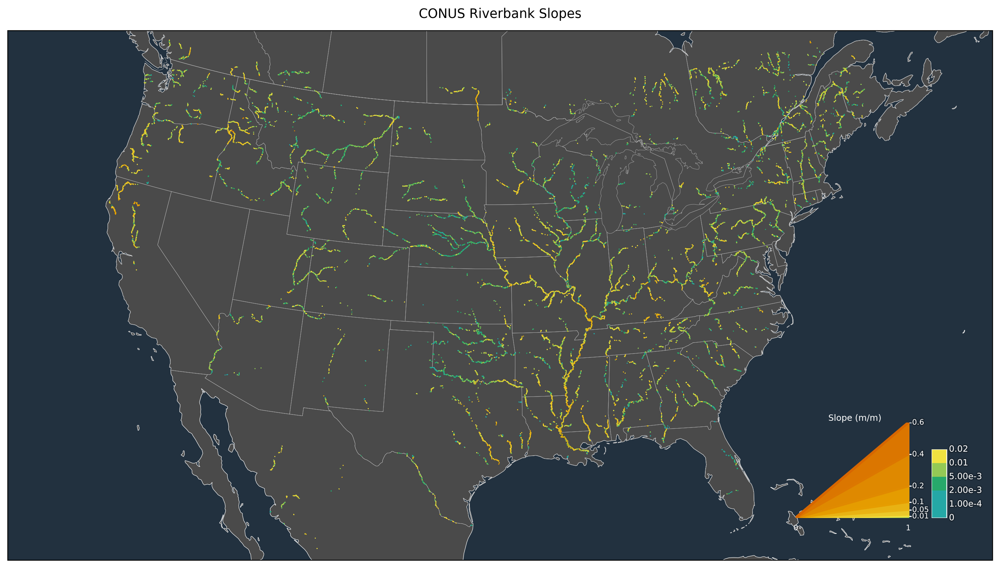

In [4]:
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------- CONFIG ----------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL, LON_COL, VAL_COL = "lat", "lon", "slope1"

CONUS_BBOX = (-125, -66, 24, 50)   # (min_lon, max_lon, min_lat, max_lat)

FIGSIZE    = (13, 8)
POINT_SIZE = 0.55
ALPHA      = 0.9

MIN_SLOPE, MAX_SLOPE = 1e-4, 1.0
BREAKS = np.array([0.0001, 0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.4, 0.6, 1.0])
TRIANGLE_VMAX = 0.6
COLOR_GAMMA   = 0.65

LEG_ANCHOR  = (0.80, 0.08)      # move triangle further right/down
LEG_SIZE    = (0.12, 0.18)      # ↓ smaller legend
N_LEG_LINES = 220

# ---------- color map (same as global)
def okabe_ito_cont():
    return LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9","#009E73","#F0E442","#E69F00","#D55E00"],
        N=256
    )
cmap_cont = okabe_ito_cont()

n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = centers ** COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybrid")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

# ---------- projection
proj = ccrs.AlbersEqualArea(central_longitude=-96, central_latitude=37.5,
                            standard_parallels=(29.5, 45.5))
pc   = ccrs.PlateCarree()

# ---------- load + subset
files = sorted(glob.glob(CSV_GLOB))
if not files: raise FileNotFoundError("No CSVs found")

dfs = []
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL, LON_COL, VAL_COL]).dropna()
        dfs.append(df)
    except Exception as e:
        print(f"skip {f}: {e}")

data = pd.concat(dfs, ignore_index=True)
data = data[(data[VAL_COL] >= MIN_SLOPE) & (data[VAL_COL] <= MAX_SLOPE)]

# (fix) don’t unpack the bbox into two vars
conus = data[
    (data[LON_COL] >= CONUS_BBOX[0]) & (data[LON_COL] <= CONUS_BBOX[1]) &
    (data[LAT_COL] >= CONUS_BBOX[2]) & (data[LAT_COL] <= CONUS_BBOX[3])
].reset_index(drop=True)
print(f"✅ CONUS points: {len(conus):,}")

# ---------- figure
plt.figure(figsize=FIGSIZE, dpi=220, facecolor="none")
ax = plt.axes(projection=proj)
ax.set_extent(CONUS_BBOX, crs=pc)
ax.set_facecolor("none")

ax.add_feature(cfeature.LAND,  facecolor="#4a4a4a", zorder=0)
ax.add_feature(cfeature.OCEAN, facecolor="#22313f", zorder=0)
ax.coastlines("50m", linewidth=0.4, color="white", zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.25, edgecolor="lightgray", zorder=1)
try:
    ax.add_feature(cfeature.STATES.with_scale("50m"),
                   linewidth=0.25, edgecolor="#bbbbbb", zorder=1)
except Exception:
    pass

ax.scatter(
    conus[LON_COL], conus[LAT_COL],
    c=conus[VAL_COL], s=POINT_SIZE, cmap=cmap, norm=norm,
    transform=pc, linewidths=0, alpha=ALPHA, rasterized=True, zorder=2
)

# ---------- legend fan + low-end bar (same as global)
def fmt_lab(y: float)->str:
    if y == 0: return "0"
    if y >= 0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e = int(np.floor(np.log10(y))); sig = y / 10**e
    return f"{sig:.2f}e{e}"

ax_leg = ax.inset_axes([LEG_ANCHOR[0], LEG_ANCHOR[1], LEG_SIZE[0], LEG_SIZE[1]],
                       transform=ax.transAxes, zorder=5)
ax_leg.set_facecolor((0,0,0,0))
for s in ax_leg.spines.values(): s.set_visible(False)

# fan
for sv in np.linspace(BREAKS[0], TRIANGLE_VMAX, N_LEG_LINES):
    ax_leg.plot([0,1],[0,sv], color=cmap(norm(sv)), lw=2.4,
                solid_capstyle="round", alpha=0.98, zorder=3)
ax_leg.plot([0,1],[0,0], color="white", lw=0.9)
ax_leg.plot([1,1],[0,TRIANGLE_VMAX], color="white", lw=0.9)

# remove the 0.02 label
LOW_KEEP = {0.01}   # <- only keep 0.01 near vertex
LABEL_TICKS = [b for b in BREAKS[1:] if (b <= TRIANGLE_VMAX and (b >= 0.02 or b in LOW_KEEP))]

for b in LABEL_TICKS:
    if b == 0.02:     # <- skip drawing the 0.02 tick/label
        continue
    ax_leg.hlines(b, 1.0, 1.03, colors="white", lw=1.0)
    ax_leg.text(1.035, b, fmt_lab(b), va="center", ha="left", fontsize=7,
                color="white",
                path_effects=[pe.Stroke(linewidth=2, foreground="black", alpha=0.25), pe.Normal()])

for x0,lab in [(0,"0"),(1,"1")]:
    ax_leg.vlines(x0,0,0,colors="white",lw=0.8)
    ax_leg.annotate(lab, xy=(x0,0), xycoords="data",
                    xytext=(0,-6), textcoords="offset points",
                    ha="center", va="top", fontsize=7, color="white")

ax_leg.set_xlim(0,1.05)
ax_leg.set_ylim(0,TRIANGLE_VMAX)
ax_leg.set_xticks([]); ax_leg.set_yticks([])
ax_leg.set_title("Slope (m/m)", fontsize=8, color="white", pad=2)

# ---------- keep the low-end vertical bar 0-0.02 unchanged ----------
LOW_MAX, GAP = 0.02, 0.018
BAR_W, BAR_H = 0.020, LEG_SIZE[1]*0.72
BAR_LEFT     = LEG_ANCHOR[0] + LEG_SIZE[0] + GAP

ax_bar = ax.inset_axes([BAR_LEFT, LEG_ANCHOR[1], BAR_W, BAR_H],
                       transform=ax.transAxes, zorder=6)
ax_bar.set_facecolor((0,0,0,0))
for s in ax_bar.spines.values(): s.set_visible(False)

low_edges = BREAKS[(BREAKS>=0) & (BREAKS<=LOW_MAX)]
if 0.0 not in low_edges: low_edges = np.r_[0.0, low_edges]
low_edges = np.unique(low_edges)
if low_edges.size < 2: low_edges = np.array([0.0, LOW_MAX])

low_bins = list(zip(low_edges[:-1], low_edges[1:]))
slice_h  = LOW_MAX / len(low_bins)

for i,(a,b) in enumerate(low_bins):
    cval = 0.5*(a+b)
    y0   = i*slice_h
    ax_bar.add_patch(Rectangle((0,y0), 1.0, slice_h,
                               facecolor=cmap(norm(cval)), edgecolor='none'))
    ax_bar.text(1.15, y0+slice_h, fmt_lab(b), va="center", ha="left",
                fontsize=8, color="white",
                path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25), pe.Normal()])

ax_bar.text(1.15, 0.0, "0", va="center", ha="left", fontsize=8, color="white",
            path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25), pe.Normal()])

ax_bar.vlines([0,1], 0, LOW_MAX, colors="white", lw=0.8)
ax_bar.hlines([0,LOW_MAX], 0, 1, colors="white", lw=0.8)
ax_bar.set_xlim(0,1.3); ax_bar.set_ylim(0,LOW_MAX)
ax_bar.set_xticks([]); ax_bar.set_yticks([])

ax.set_title("CONUS Riverbank Slopes",
             pad=12, color="black")

plt.tight_layout()
plt.show()


✅ Alaska rows: 1,785,750


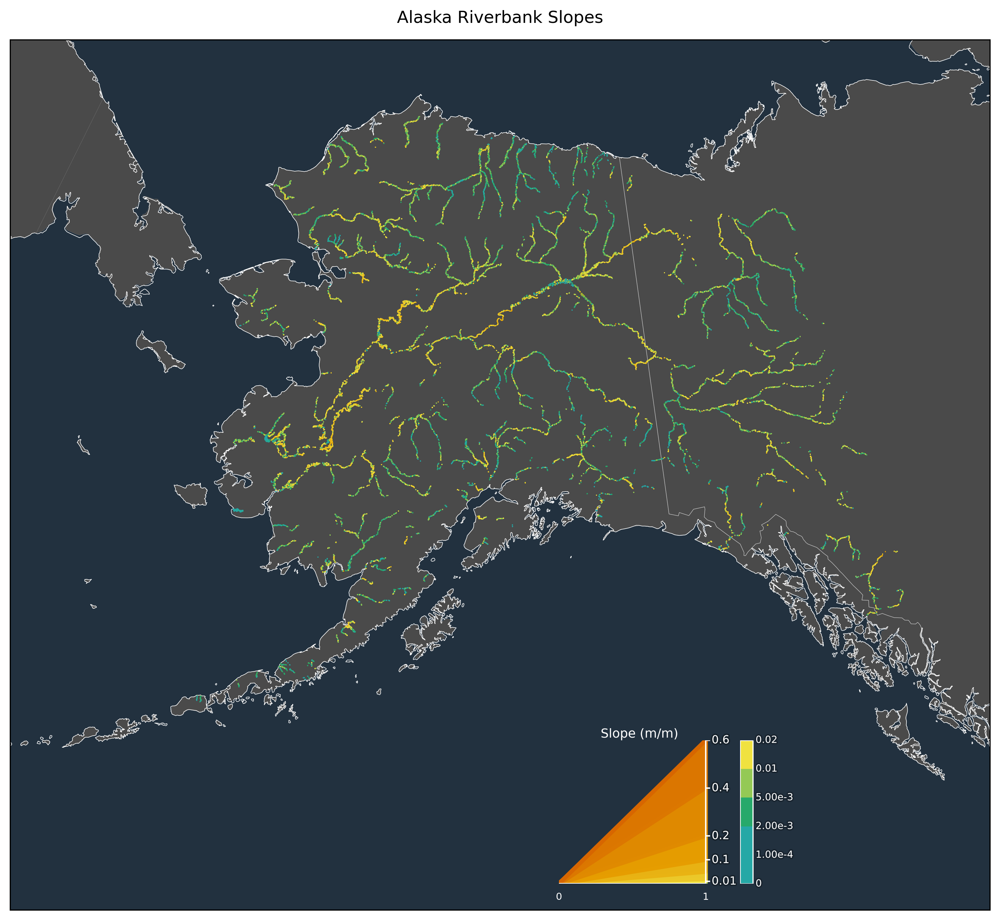

In [3]:
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------- CONFIG ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL    = "lat";  LON_COL = "lon";  VAL_COL = "slope1"

ALASKA_BBOX = (-170, -130, 50, 72)

FIGSIZE     = (10, 10)
POINT_SIZE  = 0.5
ALPHA       = 0.9
MIN_SLOPE   = 1e-4
MAX_SLOPE   = 1.0

BREAKS = np.array([0.0001,0.002,0.005,0.01,0.02,0.05,0.1,0.2,0.4,0.6,1.0])
TRIANGLE_VMAX = 0.6  # 0.6 m/m -> atan(0.6) ≈ 30.96°  ✅ real geometry

# Legend placement & size
LEG_ANCHOR  = (0.56, 0.03)      # ★ moved left & a touch up
LEG_SIZE    = (0.165, 0.165)    # ★ 75% of previous (0.22 → 0.165)
N_LEG_LINES = 240
COLOR_GAMMA = 0.65

# ---------------- PALETTE ----------------
def okabe_ito_cont():
    from matplotlib.colors import LinearSegmentedColormap
    return LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9","#009E73","#F0E442","#E69F00","#D55E00"], N=256)

cmap_cont = okabe_ito_cont()
n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers,0,1)**COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

# ---------------- LOAD DATA ----------------
files = sorted(glob.glob(CSV_GLOB))
dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL,LON_COL,VAL_COL])
        dfs.append(df.dropna(subset=[LAT_COL,LON_COL,VAL_COL]))
    except: pass
data = pd.concat(dfs, ignore_index=True)
data = data[(data[VAL_COL]>=MIN_SLOPE)&(data[VAL_COL]<=MAX_SLOPE)].copy()

lon0, lon1, lat0, lat1 = ALASKA_BBOX
ak = data[(data[LON_COL]>=lon0)&(data[LON_COL]<=lon1)&
          (data[LAT_COL]>=lat0)&(data[LAT_COL]<=lat1)].reset_index(drop=True)
vals = ak[VAL_COL].to_numpy()
print(f"✅ Alaska rows: {len(ak):,}")

# ---------------- FIGURE ----------------
proj = ccrs.AlbersEqualArea(central_longitude=-150, central_latitude=63,
                            standard_parallels=(55,70))
pc = ccrs.PlateCarree()

plt.figure(figsize=FIGSIZE, dpi=300, facecolor="none")
ax = plt.axes(projection=proj)
ax.set_extent([lon0,lon1,lat0,lat1], crs=pc)
ax.set_facecolor("none")
ax.add_feature(cfeature.LAND,facecolor="#4a4a4a",edgecolor="none",zorder=0)
ax.add_feature(cfeature.OCEAN,facecolor="#22313f",edgecolor="none",zorder=0)
ax.coastlines("10m",linewidth=0.4,color="white",zorder=1)
ax.add_feature(cfeature.BORDERS,linewidth=0.3,edgecolor="lightgray",zorder=1)

ax.scatter(ak[LON_COL], ak[LAT_COL],
           c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
           transform=pc, alpha=ALPHA, linewidths=0, rasterized=True, zorder=2)

# ---------------- LEGEND (triangle) ----------------
def fmt_lab(y):
    if y==0: return "0"
    if y>=0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e=int(np.floor(np.log10(y))); sig=y/10**e
    return f"{sig:.2f}e{e}"

ax_leg = ax.inset_axes([LEG_ANCHOR[0],LEG_ANCHOR[1],LEG_SIZE[0],LEG_SIZE[1]],
                       transform=ax.transAxes, zorder=5)
ax_leg.set_facecolor((0,0,0,0))
for s in ax_leg.spines.values(): s.set_visible(False)

for sv in np.linspace(BREAKS[0], TRIANGLE_VMAX, N_LEG_LINES):
    ax_leg.plot([0,1],[0,sv], color=cmap(norm(sv)),
                lw=3, solid_capstyle="round", alpha=0.98, zorder=3)

ax_leg.plot([0,1],[0,0],color="white",lw=1,zorder=4)
ax_leg.plot([1,1],[0,TRIANGLE_VMAX],color="white",lw=1,zorder=4)

LOW_KEEP={0.01}  # ★ 0.02 intentionally omitted
LABEL_TICKS=[b for b in BREAKS[1:] if (b<=TRIANGLE_VMAX and (b > 0.05 or b in LOW_KEEP))]
for b in LABEL_TICKS:
    ax_leg.hlines(b,1.0,1.03,colors="white",lw=1.0,zorder=5)
    ax_leg.text(1.04,b,fmt_lab(b),va="center",ha="left",fontsize=8,color="white",zorder=6,
                path_effects=[pe.Stroke(linewidth=2,foreground="black",alpha=0.3),pe.Normal()])

for x0,lab in [(0,"0"),(1,"1")]:
    ax_leg.vlines(x0,0,0,colors="white",lw=1)
    ax_leg.annotate(lab,xy=(x0,0),xycoords="data",
                    xytext=(0,-6),textcoords="offset points",
                    ha="center",va="top",fontsize=7,color="white")

ax_leg.set_xlim(0,1.1)
ax_leg.set_ylim(0,TRIANGLE_VMAX)
ax_leg.set_xticks([]); ax_leg.set_yticks([])
ax_leg.set_title("Slope (m/m)",fontsize=9,color="white",pad=2)

# ---------------- Low-slope bar (match triangle HEIGHT) ----------------
LOW_MAX  = 0.02
BAR_W    = LEG_SIZE[0] * 0.10           # narrow bar
BAR_H    = LEG_SIZE[1]                  # ★ same physical height as triangle
BAR_GAP  = 0.02

ax_bar = ax.inset_axes([LEG_ANCHOR[0]+LEG_SIZE[0]+BAR_GAP,
                        LEG_ANCHOR[1],
                        BAR_W, BAR_H],
                       transform=ax.transAxes, zorder=6)
ax_bar.set_facecolor((0,0,0,0))
for s in ax_bar.spines.values(): s.set_visible(False)

low_edges = BREAKS[(BREAKS>=0)&(BREAKS<=LOW_MAX)]
if 0.0 not in low_edges: low_edges = np.r_[0.0, low_edges]
low_edges = np.unique(low_edges)
low_bins  = list(zip(low_edges[:-1], low_edges[1:]))
n_low     = len(low_bins)
slice_h   = LOW_MAX / n_low

for i,(a,b) in enumerate(low_bins):
    cval = 0.5*(a+b)
    y0 = i*slice_h
    ax_bar.add_patch(Rectangle((0,y0),1.0,slice_h,
                               facecolor=cmap(norm(cval)),edgecolor='none'))
    ax_bar.text(1.2, y0+slice_h, fmt_lab(b),
                va="center", ha="left", fontsize=7, color="white",
                path_effects=[pe.Stroke(linewidth=2,foreground="black",alpha=0.25),pe.Normal()])

ax_bar.text(1.2,0.0,"0",va="center",ha="left",fontsize=7,color="white",
            path_effects=[pe.Stroke(linewidth=2,foreground="black",alpha=0.25),pe.Normal()])
ax_bar.vlines([0,1],0,LOW_MAX,colors="white",lw=0.8)
ax_bar.hlines([0,LOW_MAX],0,1,colors="white",lw=0.8)
ax_bar.set_xlim(0,1.25)
ax_bar.set_ylim(0,LOW_MAX)
ax_bar.set_xticks([]); ax_bar.set_yticks([])

# ----------------
ax.set_title("Alaska Riverbank Slopes", pad=12, color="black")
plt.tight_layout()
plt.show()


✅ Amazon subset: 2,277,023 points


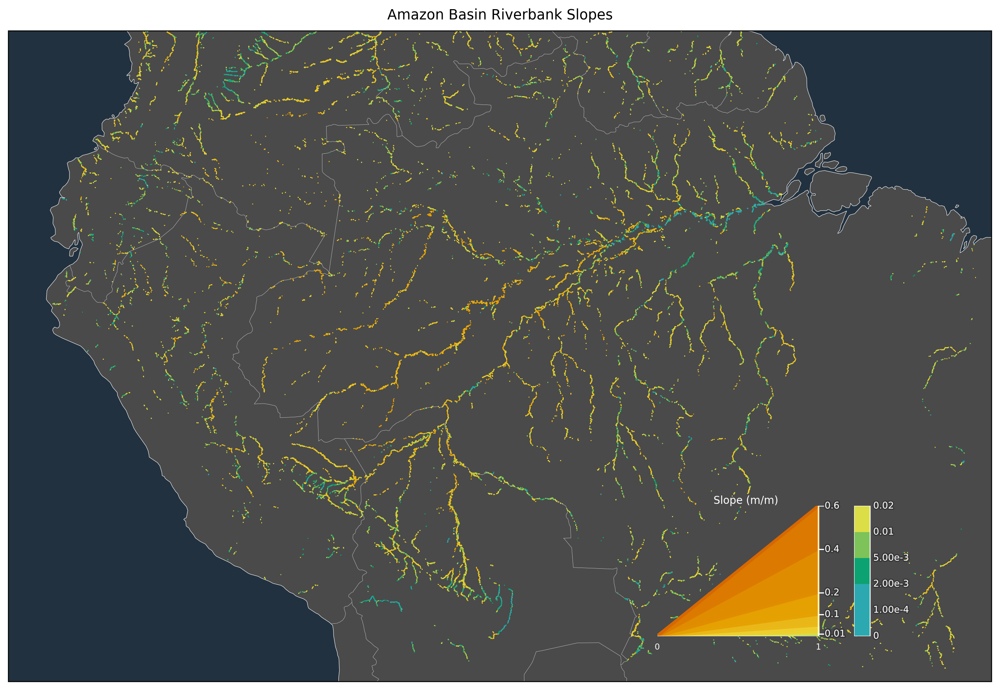

In [4]:
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------- CONFIG ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL    = "lat"
LON_COL    = "lon"
VAL_COL    = "slope1"

# Amazon basin view (wide, includes Andean front and mouth)
AMAZON_EXTENT = (-82.0, -44.0, -20.0, 6.0)

FIGSIZE    = (12, 9)
POINT_SIZE = 0.45
ALPHA      = 0.9

# Filter plausible slopes
MIN_SLOPE  = 1e-4
MAX_SLOPE  = 1.0                # keep up to 1 m/m ≈ 45°

# Hybrid breaks (discrete classes) — includes top class 0.6–1.0
BREAKS = np.array([
    0.0001, 0.002, 0.005, 0.01, 0.02,
    0.05, 0.1, 0.2, 0.4, 0.6, 1.0
])

# Triangle top you decided to use for readability
TRIANGLE_VMAX = 0.6

# Legend placement (bottom-right, smaller)
LEG_ANCHOR  = (0.66, 0.07)      # (left, bottom) in axes fraction
LEG_SIZE    = (0.18, 0.20)      # triangle width, height (smaller than before)
N_LEG_LINES = 240

# Contrast knob (keeps palette): gamma < 1 boosts mid/high contrast
COLOR_GAMMA = 0.70
# -----------------------------------------

# Palette: Okabe–Ito continuous -> gamma-sampled discrete
def okabe_ito_cont():
    return mpl.colors.LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9", "#009E73", "#F0E442", "#E69F00", "#D55E00"],
        N=256
    )
cmap_cont = okabe_ito_cont()

n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers, 0, 1) ** COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

# Projection focused on Amazon (South America Albers)
proj = ccrs.AlbersEqualArea(central_longitude=-60.0, central_latitude=-5.0,
                            standard_parallels=(-5.0, -20.0))
pc   = ccrs.PlateCarree()

# ---------------- Load & subset ----------------
files = sorted(glob.glob(CSV_GLOB))
if not files:
    raise FileNotFoundError("No CSVs found")

dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL, LON_COL, VAL_COL])
        dfs.append(df.dropna(subset=[LAT_COL, LON_COL, VAL_COL]))
    except Exception as e:
        print(f"⚠️ Skipped {f}: {e}")

data = pd.concat(dfs, ignore_index=True)
data = data[(data[VAL_COL] >= MIN_SLOPE) & (data[VAL_COL] <= MAX_SLOPE)]

# clip to Amazon extent
min_lon, max_lon, min_lat, max_lat = AMAZON_EXTENT
region = data[
    (data[LON_COL] >= min_lon) & (data[LON_COL] <= max_lon) &
    (data[LAT_COL] >= min_lat) & (data[LAT_COL] <= max_lat)
].reset_index(drop=True)
vals = region[VAL_COL].to_numpy()
print(f"✅ Amazon subset: {len(region):,} points")

# ---------------- Figure ----------------
plt.figure(figsize=FIGSIZE, dpi=220, facecolor="none")
ax = plt.axes(projection=proj)
ax.set_extent(AMAZON_EXTENT, crs=pc)

# background
ax.set_facecolor("none")
ax.add_feature(cfeature.LAND,  facecolor="#4a4a4a", edgecolor="none", zorder=0)
ax.add_feature(cfeature.OCEAN, facecolor="#22313f", edgecolor="none", zorder=0)
ax.coastlines("50m", linewidth=0.35, color="white", zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.25, edgecolor="lightgray", zorder=1)

# rivers (points)
ax.scatter(
    region[LON_COL], region[LAT_COL],
    c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
    transform=pc,
    linewidths=0, alpha=ALPHA, rasterized=True, zorder=2
)

# ---------------- Helpers ----------------
def fmt_lab(y: float)->str:
    if y == 0: return "0"
    if y >= 0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e = int(np.floor(np.log10(y))); sig = y / 10**e
    return f"{sig:.2f}e{e}"

# ---------------- Triangle legend (real slope geometry) ----------------
ax_leg = ax.inset_axes([LEG_ANCHOR[0], LEG_ANCHOR[1], LEG_SIZE[0], LEG_SIZE[1]],
                       transform=ax.transAxes, zorder=5)
ax_leg.set_facecolor((0,0,0,0))
for s in ax_leg.spines.values(): s.set_visible(False)

# fan (value-true)
s0 = BREAKS[0]
for sv in np.linspace(s0, TRIANGLE_VMAX, N_LEG_LINES):
    ax_leg.plot([0, 1], [0, sv], color=cmap(norm(sv)), lw=2.6,
                solid_capstyle="round", alpha=0.98, zorder=3)

# triangle frame
ax_leg.plot([0, 1], [0, 0], color="white", lw=1.0, zorder=6)
ax_leg.plot([1, 1], [0, TRIANGLE_VMAX], color="white", lw=1.0, zorder=6)

# labels: keep 0.01, drop 0.02; keep main labels > 0.05
LOW_KEEP = {0.01}                      # ← 0.02 intentionally excluded
LABEL_TICKS = [b for b in BREAKS[1:]
               if (b <= TRIANGLE_VMAX and (b > 0.05 or b in LOW_KEEP))]

for b in LABEL_TICKS:
    ax_leg.hlines(b, 1.0, 1.035, colors="white", lw=1.0, zorder=7)
    ax_leg.text(1.04, b, fmt_lab(b), va="center", ha="left", fontsize=8,
                color="white", zorder=8,
                path_effects=[pe.Stroke(linewidth=2.2, foreground="black", alpha=0.25),
                              pe.Normal()])

# base ticks
for x0, lab in [(0, "0"), (1, "1")]:
    ax_leg.vlines(x0, 0, 0, colors="white", lw=1.0)
    ax_leg.annotate(lab, xy=(x0, 0), xycoords="data",
                    xytext=(0, -6), textcoords="offset points",
                    ha="center", va="top", fontsize=7, color="white")

ax_leg.set_xlim(0, 1.10)
ax_leg.set_ylim(0, TRIANGLE_VMAX)
ax_leg.set_xticks([]); ax_leg.set_yticks([])
ax_leg.set_title("Slope (m/m)", fontsize=9, color="white", pad=2)

# ---------------- Low-end 0–0.02 bar (same height as triangle) -------------
LOW_MAX  = 0.02
GAP      = 0.02
BAR_W    = 0.022
# make the bar the *same height* as the triangle (in axes units)
BAR_H    = LEG_SIZE[1]
BAR_LEFT = LEG_ANCHOR[0] + LEG_SIZE[0] + GAP

ax_bar = ax.inset_axes([BAR_LEFT, LEG_ANCHOR[1], BAR_W, BAR_H],
                       transform=ax.transAxes, zorder=6)
ax_bar.set_facecolor((0,0,0,0))
for s in ax_bar.spines.values(): s.set_visible(False)

# edges in [0, LOW_MAX], include 0 explicitly
low_edges = BREAKS[(BREAKS >= 0) & (BREAKS <= LOW_MAX)]
if 0.0 not in low_edges: low_edges = np.r_[0.0, low_edges]
low_edges = np.unique(low_edges)
if low_edges.size < 2: low_edges = np.array([0.0, LOW_MAX])

# equal-height slices (one per color bin within 0–0.02)
low_bins  = list(zip(low_edges[:-1], low_edges[1:]))
n_low     = len(low_bins)
slice_h   = LOW_MAX / n_low

for i, (a, b) in enumerate(low_bins):
    cval = 0.5*(a+b)
    y0   = i * slice_h
    ax_bar.add_patch(Rectangle((0, y0), 1.0, slice_h,
                               facecolor=cmap(norm(cval)), edgecolor='none', zorder=2))
    # label **every** slice (upper edge); this keeps one label per color
    ax_bar.text(1.20, y0 + slice_h, fmt_lab(b), va="center", ha="left",
                fontsize=8, color="white", zorder=3,
                path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                              pe.Normal()])

# bottom "0"
ax_bar.text(1.20, 0.0, "0", va="center", ha="left",
            fontsize=8, color="white",
            path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                          pe.Normal()])

# frame
ax_bar.vlines([0, 1], 0, LOW_MAX, colors="white", lw=0.8, zorder=3)
ax_bar.hlines([0, LOW_MAX], 0, 1, colors="white", lw=0.8, zorder=3)
ax_bar.set_xlim(0, 1.35)
ax_bar.set_ylim(0, LOW_MAX)
ax_bar.set_xticks([]); ax_bar.set_yticks([])

# ---------------- Title ----------------
ax.set_title("Amazon Basin Riverbank Slopes", pad=10, color="black")

plt.tight_layout()
plt.show()


✅ Colombia subset: 729,492 points
ℹ️  slope 0.6 -> angle ≈ 30.96° (real geometry)


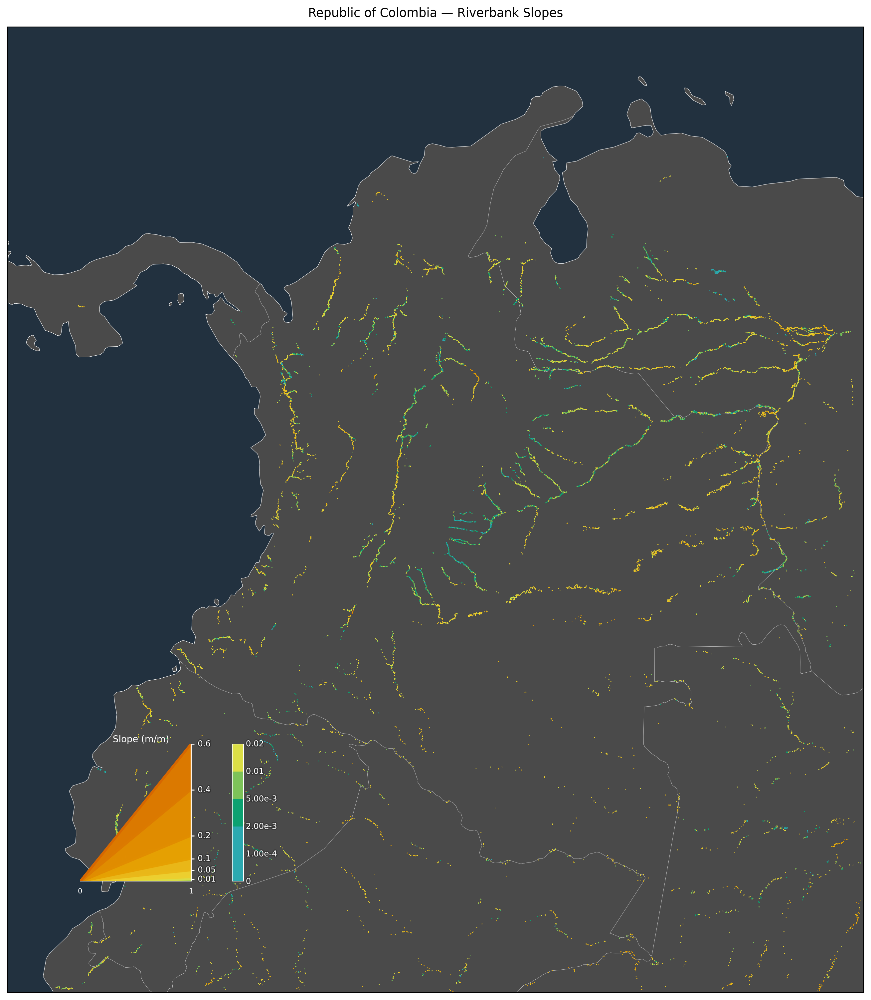

In [16]:

from math import atan, degrees

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------- CONFIG ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL    = "lat"
LON_COL    = "lon"
VAL_COL    = "slope1"

CO_EXTENT  = (-82.0, -66.0, -5.0, 13.5)

FIGSIZE    = (12, 16)
POINT_SIZE = 0.45
ALPHA      = 0.9

MIN_SLOPE  = 1e-4
MAX_SLOPE  = 1.0

BREAKS = np.array([0.0001, 0.002, 0.005, 0.01, 0.02,
                   0.05, 0.1, 0.2, 0.4, 0.6, 1.0])

TRIANGLE_VMAX = 0.6            # top of triangle in slope (m/m)

# ---- SIZE SCALING (75%) ----
SCALE      = 0.75
LEG_ANCHOR = (0.085, 0.115)                      # keep position
LEG_SIZE   = (0.19 * SCALE, 0.19 * SCALE)        # triangle (W,H) scaled
BAR_W      = 0.024 * SCALE                       # bar width scaled
GAP        = 0.035                               # gap unchanged (clean separation)

N_LEG_LINES = 240
COLOR_GAMMA = 0.70
# -----------------------------------------

def okabe_ito_cont():
    return mpl.colors.LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9", "#009E73", "#F0E442", "#E69F00", "#D55E00"], N=256
    )
cmap_cont = okabe_ito_cont()

n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers, 0, 1) ** COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

proj = ccrs.AlbersEqualArea(central_longitude=-74, central_latitude=5,
                            standard_parallels=(3, 12))
pc   = ccrs.PlateCarree()

# -------- load & subset --------
files = sorted(glob.glob(CSV_GLOB))
dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL, LON_COL, VAL_COL]).dropna()
        dfs.append(df)
    except Exception as e:
        print("skip", f, e)

data = pd.concat(dfs, ignore_index=True)
data = data[(data[VAL_COL] >= MIN_SLOPE) & (data[VAL_COL] <= MAX_SLOPE)]

min_lon, max_lon, min_lat, max_lat = CO_EXTENT
region = data[(data[LON_COL] >= min_lon) & (data[LON_COL] <= max_lon) &
              (data[LAT_COL] >= min_lat) & (data[LAT_COL] <= max_lat)].reset_index(drop=True)
vals = region[VAL_COL].to_numpy()
print(f"✅ Colombia subset: {len(region):,} points")

# quick geometry check (kept in output once, safe to delete later)
ang_deg = degrees(atan(0.6))
print(f"ℹ️  slope 0.6 -> angle ≈ {ang_deg:.2f}° (real geometry)")

# -------- figure --------
plt.figure(figsize=FIGSIZE, dpi=220, facecolor="none")
ax = plt.axes(projection=proj)
ax.set_extent(CO_EXTENT, crs=pc)
ax.set_facecolor("none")
ax.add_feature(cfeature.LAND,  facecolor="#4a4a4a", edgecolor="none", zorder=0)
ax.add_feature(cfeature.OCEAN, facecolor="#22313f", edgecolor="none", zorder=0)
ax.coastlines("50m", linewidth=0.35, color="white", zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.25, edgecolor="lightgray", zorder=1)

ax.scatter(region[LON_COL], region[LAT_COL],
           c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
           transform=pc, linewidths=0, alpha=ALPHA, rasterized=True, zorder=2)

def fmt_lab(y: float) -> str:
    if y == 0: return "0"
    if y >= 0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e = int(np.floor(np.log10(y))); sig = y / 10**e
    return f"{sig:.2f}e{e}"

# -------- triangle (real slope geometry) --------
ax_leg = ax.inset_axes([LEG_ANCHOR[0], LEG_ANCHOR[1], LEG_SIZE[0], LEG_SIZE[1]],
                       transform=ax.transAxes, zorder=5)
ax_leg.set_facecolor((0,0,0,0))
for s in ax_leg.spines.values(): s.set_visible(False)

for sv in np.linspace(BREAKS[0], TRIANGLE_VMAX, N_LEG_LINES):
    ax_leg.plot([0, 1], [0, sv], color=cmap(norm(sv)), lw=2.4,
                solid_capstyle="round", alpha=0.98, zorder=3)

ax_leg.plot([0, 1], [0, 0],             color="white", lw=1.0, zorder=6)
ax_leg.plot([1, 1], [0, TRIANGLE_VMAX], color="white", lw=1.0, zorder=6)

LOW_KEEP = {0.01}   # 0.02 intentionally omitted
LABEL_TKS = [b for b in BREAKS[1:] if (b <= TRIANGLE_VMAX and (b >= 0.05 or b in LOW_KEEP))]
for b in LABEL_TKS:
    ax_leg.hlines(b, 1.00, 1.03, colors="white", lw=1.0, zorder=7)
    ax_leg.text(1.06, b, fmt_lab(b), va="center", ha="left", fontsize=8, color="white",
                path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.30),
                              pe.Normal()], zorder=8)

for x0, lab in [(0, "0"), (1, "1")]:
    ax_leg.vlines(x0, 0, 0, colors="white", lw=1.0)
    ax_leg.annotate(lab, xy=(x0, 0), xycoords="data",
                    xytext=(0, -6), textcoords="offset points",
                    ha="center", va="top", fontsize=7, color="white")

ax_leg.set_xlim(0, 1.10)
ax_leg.set_ylim(0, TRIANGLE_VMAX)
ax_leg.set_xticks([]); ax_leg.set_yticks([])
ax_leg.set_title("Slope (m/m)", fontsize=9, color="white", pad=2)

# -------- low-end 0–0.02 bar (same height; clear gap) --------
LOW_MAX  = 0.02
BAR_LEFT = LEG_ANCHOR[0] + LEG_SIZE[0] + GAP
BAR_H    = LEG_SIZE[1]                      # exact match to triangle height

ax_bar = ax.inset_axes([BAR_LEFT, LEG_ANCHOR[1], BAR_W, BAR_H],
                       transform=ax.transAxes, zorder=6)
ax_bar.set_facecolor((0,0,0,0))
for s in ax_bar.spines.values(): s.set_visible(False)

low_edges = BREAKS[(BREAKS >= 0) & (BREAKS <= LOW_MAX)]
if 0.0 not in low_edges: low_edges = np.r_[0.0, low_edges]
low_edges = np.unique(low_edges)
low_bins  = list(zip(low_edges[:-1], low_edges[1:]))
n_low     = max(1, len(low_bins))
slice_h   = LOW_MAX / n_low

for i, (a, b) in enumerate(low_bins):
    cval = 0.5*(a+b)
    y0   = i * slice_h
    ax_bar.add_patch(Rectangle((0, y0), 1.0, slice_h,
                               facecolor=cmap(norm(cval)), edgecolor='none', zorder=2))
    ax_bar.text(1.20, y0 + slice_h, fmt_lab(b),
                va="center", ha="left", fontsize=8, color="white",
                path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                              pe.Normal()])

ax_bar.text(1.20, 0.0, "0", va="center", ha="left", fontsize=8, color="white",
            path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                          pe.Normal()])

ax_bar.vlines([0, 1], 0, LOW_MAX, colors="white", lw=0.8, zorder=3)
ax_bar.hlines([0, LOW_MAX], 0, 1, colors="white", lw=0.8, zorder=3)
ax_bar.set_xlim(0, 1.35)
ax_bar.set_ylim(0, LOW_MAX)
ax_bar.set_xticks([]); ax_bar.set_yticks([])

# -------- title --------
ax.set_title("Republic of Colombia — Riverbank Slopes", pad=10, color="black")
plt.tight_layout()
plt.show()



✅ Russia north subset: 10,692,070 points


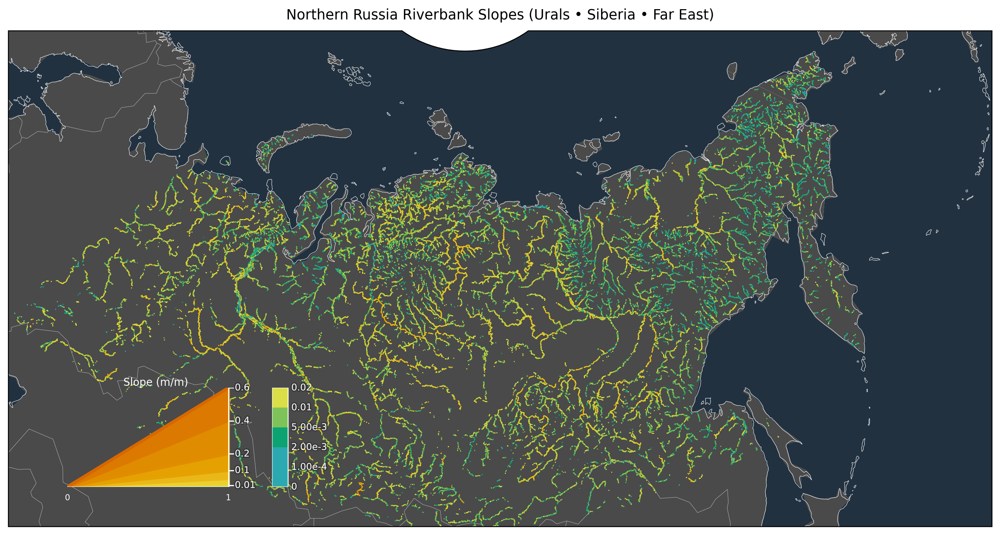

In [17]:
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------- CONFIG ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL    = "lat"
LON_COL    = "lon"
VAL_COL    = "slope1"

# Northern Russia (Urals + Siberia + Far East) – keep only the north
# (lon_min, lon_max, lat_min, lat_max); wrap past 180 via 190≈170W to include Chukotka
RU_NORTH_EXTENT = (45.0, 190.0, 50.0, 78.5)

FIGSIZE    = (12, 9)
POINT_SIZE = 0.45
ALPHA      = 0.9

# Filter plausible slopes (m/m)
MIN_SLOPE  = 1e-4
MAX_SLOPE  = 1.0              # up to 45°

# Hybrid breaks (same palette bins you’ve been using; includes 0.6–1.0)
BREAKS = np.array([0.0001, 0.002, 0.005, 0.01, 0.02,
                   0.05, 0.1, 0.2, 0.4, 0.6, 1.0])

# Triangle top for readability (keeps true geometry)
TRIANGLE_VMAX = 0.6

# Legend (keep proportions you like; triangle + bar same height, with a gap)
LEG_ANCHOR  = (0.06, 0.08)    # lower-left of triangle (axes fraction)
LEG_SIZE    = (0.18, 0.20)    # triangle (width, height)
N_LEG_LINES = 240
GAP         = 0.028           # space between triangle and bar
BAR_W       = 0.022           # color bar width; height will match triangle

# Contrast knob (keeps palette colors but boosts mid/high contrast)
COLOR_GAMMA = 0.70
# -----------------------------------------

# Palette: Okabe–Ito continuous -> gamma-sampled discrete
def okabe_ito_cont():
    return mpl.colors.LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9", "#009E73", "#F0E442", "#E69F00", "#D55E00"],
        N=256
    )
cmap_cont = okabe_ito_cont()
n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers, 0, 1) ** COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

# Projection focused on RU north (Albers Equal Area)
proj = ccrs.AlbersEqualArea(
    central_longitude=105.0,   # centered on Siberia
    central_latitude=65.0,
    standard_parallels=(50.0, 70.0)
)
pc = ccrs.PlateCarree()

# ---------------- Load & subset ----------------
files = sorted(glob.glob(CSV_GLOB))
if not files:
    raise FileNotFoundError("No CSVs found")

dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL, LON_COL, VAL_COL])
        dfs.append(df.dropna(subset=[LAT_COL, LON_COL, VAL_COL]))
    except Exception as e:
        print(f"⚠️ Skipped {f}: {e}")

data = pd.concat(dfs, ignore_index=True)
# filter plausible slopes
data = data[(data[VAL_COL] >= MIN_SLOPE) & (data[VAL_COL] <= MAX_SLOPE)]

# handle wrap-around: split into two if needed and concat
lon_min, lon_max, lat_min, lat_max = RU_NORTH_EXTENT
if lon_max <= 180:
    region = data[
        (data[LON_COL] >= lon_min) & (data[LON_COL] <= lon_max) &
        (data[LAT_COL] >= lat_min) & (data[LAT_COL] <= lat_max)
    ].copy()
else:
    region1 = data[
        (data[LON_COL] >= lon_min) & (data[LON_COL] <= 180) &
        (data[LAT_COL] >= lat_min) & (data[LAT_COL] <= lat_max)
    ]
    region2 = data[
        (data[LON_COL] >= -180) & (data[LON_COL] <= (lon_max-360)) &
        (data[LAT_COL] >= lat_min) & (data[LAT_COL] <= lat_max)
    ]
    region = pd.concat([region1, region2], ignore_index=True)

vals = region[VAL_COL].to_numpy()
print(f"✅ Russia north subset: {len(region):,} points")

# ---------------- Figure ----------------
plt.figure(figsize=FIGSIZE, dpi=220, facecolor="none")
ax = plt.axes(projection=proj)
ax.set_extent([lon_min if lon_min<=180 else lon_min-360,
               180 if lon_max>180 else lon_max,
               lat_min, lat_max], crs=pc)

# background
ax.set_facecolor("none")
ax.add_feature(cfeature.LAND,  facecolor="#4a4a4a", edgecolor="none", zorder=0)
ax.add_feature(cfeature.OCEAN, facecolor="#22313f", edgecolor="none", zorder=0)
ax.coastlines("50m", linewidth=0.35, color="white", zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.25, edgecolor="lightgray", zorder=1)

# points
ax.scatter(
    region[LON_COL], region[LAT_COL],
    c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
    transform=pc, linewidths=0, alpha=ALPHA, rasterized=True, zorder=2
)

# ---------------- Helpers ----------------
def fmt_lab(y: float)->str:
    if y == 0: return "0"
    if y >= 0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e = int(np.floor(np.log10(y))); sig = y / 10**e
    return f"{sig:.2f}e{e}"

# ---------------- Triangle legend (true slope geometry) ----------------
ax_leg = ax.inset_axes([LEG_ANCHOR[0], LEG_ANCHOR[1], LEG_SIZE[0], LEG_SIZE[1]],
                       transform=ax.transAxes, zorder=5)
ax_leg.set_facecolor((0,0,0,0))
for s in ax_leg.spines.values(): s.set_visible(False)

# fan (plot rays from (0,0) to (1, s))
s0 = BREAKS[0]
for sv in np.linspace(s0, TRIANGLE_VMAX, N_LEG_LINES):
    ax_leg.plot([0, 1], [0, sv], color=cmap(norm(sv)), lw=2.6,
                solid_capstyle="round", alpha=0.98, zorder=3)

# frame
ax_leg.plot([0, 1], [0, 0], color="white", lw=1.0, zorder=6)
ax_leg.plot([1, 1], [0, TRIANGLE_VMAX], color="white", lw=1.0, zorder=6)

# labels: keep 0.01, drop 0.02; keep main labels > 0.05
LOW_KEEP = {0.01}
LABEL_TICKS = [b for b in BREAKS[1:]
               if (b <= TRIANGLE_VMAX and (b > 0.05 or b in LOW_KEEP))]
for b in LABEL_TICKS:
    ax_leg.hlines(b, 1.0, 1.035, colors="white", lw=1.0, zorder=7)
    ax_leg.text(1.04, b, fmt_lab(b), va="center", ha="left", fontsize=8,
                color="white", zorder=8,
                path_effects=[pe.Stroke(linewidth=2.2, foreground="black", alpha=0.25),
                              pe.Normal()])

# base ticks 0–1 under the base
for x0, lab in [(0,"0"),(1,"1")]:
    ax_leg.vlines(x0, 0, 0, colors="white", lw=1.0)
    ax_leg.annotate(lab, xy=(x0, 0), xycoords="data",
                    xytext=(0, -6), textcoords="offset points",
                    ha="center", va="top", fontsize=7, color="white")

ax_leg.set_xlim(0, 1.10)
ax_leg.set_ylim(0, TRIANGLE_VMAX)
ax_leg.set_xticks([]); ax_leg.set_yticks([])
ax_leg.set_title("Slope (m/m)", fontsize=9, color="white", pad=2)

# ---------------- Low-end 0–0.02 bar (same height as triangle) -------------
LOW_MAX  = 0.02
BAR_LEFT = LEG_ANCHOR[0] + LEG_SIZE[0] + GAP
ax_bar = ax.inset_axes([BAR_LEFT, LEG_ANCHOR[1], BAR_W, LEG_SIZE[1]],
                       transform=ax.transAxes, zorder=6)
ax_bar.set_facecolor((0,0,0,0))
for s in ax_bar.spines.values(): s.set_visible(False)

# edges in [0, 0.02], include 0 explicitly
low_edges = BREAKS[(BREAKS >= 0) & (BREAKS <= LOW_MAX)]
if 0.0 not in low_edges: low_edges = np.r_[0.0, low_edges]
low_edges = np.unique(low_edges)
if low_edges.size < 2: low_edges = np.array([0.0, LOW_MAX])

# equal-height slices → one label per color slice (upper edge)
low_bins  = list(zip(low_edges[:-1], low_edges[1:]))
n_low     = len(low_bins)
slice_h   = LOW_MAX / n_low

for i, (a, b) in enumerate(low_bins):
    cval = 0.5*(a+b)
    y0   = i * slice_h
    ax_bar.add_patch(Rectangle((0, y0), 1.0, slice_h,
                               facecolor=cmap(norm(cval)), edgecolor='none', zorder=2))
    ax_bar.text(1.20, y0 + slice_h, fmt_lab(b), va="center", ha="left",
                fontsize=8, color="white", zorder=3,
                path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                              pe.Normal()])
# bottom "0"
ax_bar.text(1.20, 0.0, "0", va="center", ha="left",
            fontsize=8, color="white",
            path_effects=[pe.Stroke(linewidth=2.0, foreground="black", alpha=0.25),
                          pe.Normal()])

# frame
ax_bar.vlines([0, 1], 0, LOW_MAX, colors="white", lw=0.8, zorder=3)
ax_bar.hlines([0, LOW_MAX], 0, 1, colors="white", lw=0.8, zorder=3)
ax_bar.set_xlim(0, 1.35)
ax_bar.set_ylim(0, LOW_MAX)
ax_bar.set_xticks([]); ax_bar.set_yticks([])

# ---------------- Title ----------------
ax.set_title("Northern Russia Riverbank Slopes (Urals • Siberia • Far East)", pad=10, color="black")

plt.tight_layout()
plt.show()


✅ Po Valley (Italy) rows: 112,807


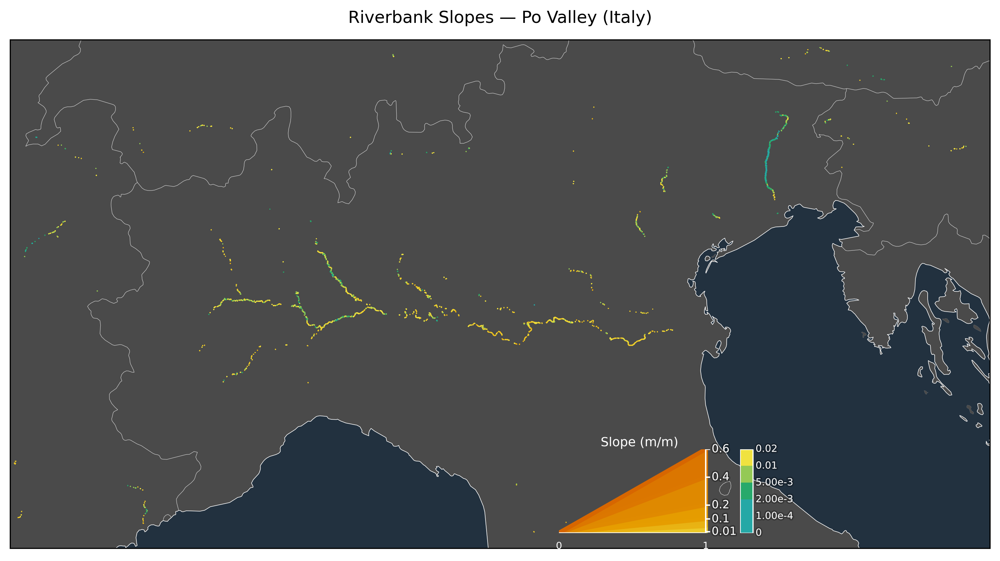

✅ Garonne (France) rows: 30,914


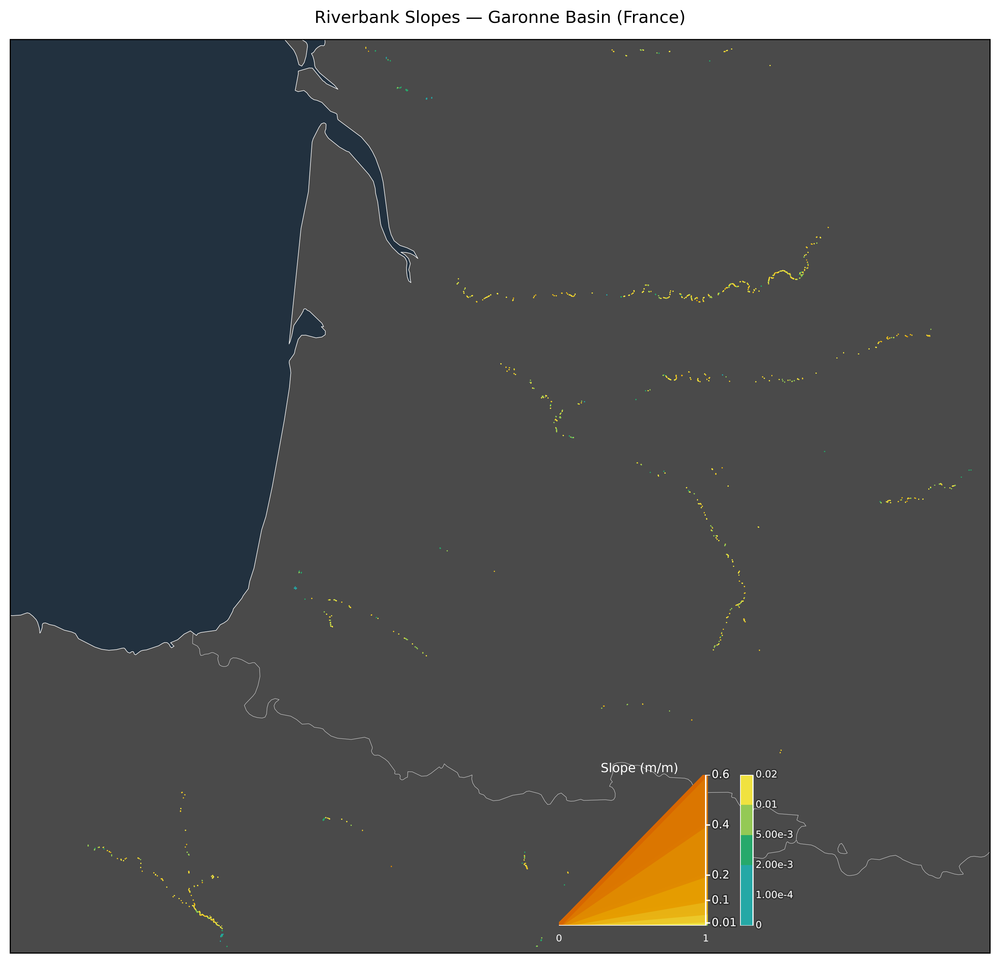

In [2]:
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------- DATA ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL, LON_COL, VAL_COL = "lat", "lon", "slope1"

# ---------------- SLOPE / LEGEND ----------------
MIN_SLOPE   = 1e-4
MAX_SLOPE   = 1.0
BREAKS      = np.array([0.0001,0.002,0.005,0.01,0.02,0.05,0.1,0.2,0.4,0.6,1.0])
TRIANGLE_VMAX = 0.6               # ≈ 31°
COLOR_GAMMA = 0.65                # contrast, keeps your palette ordering
N_LEG_LINES = 240

# Legend placement & size (same proportions as your recent regional maps)
LEG_ANCHOR  = (0.56, 0.03)        # left, bottom (axes fraction)
LEG_SIZE    = (0.165, 0.165)      # 75% of earlier big legend

# ---------------- PLOTTING ----------------
FIGSIZE     = (10, 10)
POINT_SIZE  = 0.5
ALPHA       = 0.9

# Palette (Okabe–Ito) → gamma-sampled discrete
def okabe_ito_cont():
    return LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9","#009E73","#F0E442","#E69F00","#D55E00"], N=256)

cmap_cont = okabe_ito_cont()
n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers,0,1)**COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

def fmt_lab(y):
    if y == 0: return "0"
    if y >= 0.01: return f"{y:.3f}".rstrip("0").rstrip(".")
    e = int(np.floor(np.log10(y))); sig = y / 10**e
    return f"{sig:.2f}e{e}"

# Load once
files = sorted(glob.glob(CSV_GLOB))
dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL, LON_COL, VAL_COL])
        dfs.append(df.dropna(subset=[LAT_COL, LON_COL, VAL_COL]))
    except Exception:
        pass
data = pd.concat(dfs, ignore_index=True)
data = data[(data[VAL_COL] >= MIN_SLOPE) & (data[VAL_COL] <= MAX_SLOPE)].copy()

# ---------------- Regions ----------------
REGIONS = [
    {
        "name": "Po Valley (Italy)",
        # Covers Piedmont→Veneto + lower Alpine front
        "bbox": (6.0, 14.8, 43.5, 46.8),   # (lon_min, lon_max, lat_min, lat_max)
        "proj": ccrs.LambertConformal(central_longitude=10.0, central_latitude=45.0,
                                      standard_parallels=(35.0, 55.0)),
        "title": "Riverbank Slopes — Po Valley (Italy)"
    },
    {
        "name": "Garonne (France)",
        # Pyrenees → Bordeaux estuary
        "bbox": (-2.8, 2.8, 42.0, 45.9),
        "proj": ccrs.LambertConformal(central_longitude=0.0, central_latitude=44.0,
                                      standard_parallels=(35.0, 55.0)),
        "title": "Riverbank Slopes — Garonne Basin (France)"
    }
]

pc = ccrs.PlateCarree()

for R in REGIONS:
    (lon0, lon1, lat0, lat1) = R["bbox"]
    region = data[(data[LON_COL] >= lon0) & (data[LON_COL] <= lon1) &
                  (data[LAT_COL] >= lat0) & (data[LAT_COL] <= lat1)].reset_index(drop=True)
    vals = region[VAL_COL].to_numpy()
    print(f"✅ {R['name']} rows: {len(region):,}")

    plt.figure(figsize=FIGSIZE, dpi=300, facecolor="none")
    ax = plt.axes(projection=R["proj"])
    ax.set_extent([lon0, lon1, lat0, lat1], crs=pc)

    # Background
    ax.set_facecolor("none")
    ax.add_feature(cfeature.LAND,  facecolor="#4a4a4a", edgecolor="none", zorder=0)
    ax.add_feature(cfeature.OCEAN, facecolor="#22313f", edgecolor="none", zorder=0)
    ax.coastlines("10m", linewidth=0.4, color="white", zorder=1)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="lightgray", zorder=1)

    # Points
    ax.scatter(region[LON_COL], region[LAT_COL],
               c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
               transform=pc, alpha=ALPHA, linewidths=0, rasterized=True, zorder=2)

    # ---------- Triangle legend (true slope geometry) ----------
    ax_leg = ax.inset_axes([LEG_ANCHOR[0], LEG_ANCHOR[1], LEG_SIZE[0], LEG_SIZE[1]],
                           transform=ax.transAxes, zorder=5)
    ax_leg.set_facecolor((0,0,0,0))
    for s in ax_leg.spines.values(): s.set_visible(False)

    for sv in np.linspace(BREAKS[0], TRIANGLE_VMAX, N_LEG_LINES):
        ax_leg.plot([0,1],[0,sv], color=cmap(norm(sv)),
                    lw=3, solid_capstyle="round", alpha=0.98, zorder=3)

    # triangle frame
    ax_leg.plot([0,1],[0,0], color="white", lw=1, zorder=4)
    ax_leg.plot([1,1],[0,TRIANGLE_VMAX], color="white", lw=1, zorder=4)

    # labels: keep 0.01, drop 0.02; keep ≥0.05 breaks
    LOW_KEEP={0.01}
    LABEL_TICKS=[b for b in BREAKS[1:] if (b <= TRIANGLE_VMAX and (b > 0.05 or b in LOW_KEEP))]
    for b in LABEL_TICKS:
        ax_leg.hlines(b, 1.0, 1.03, colors="white", lw=1.0, zorder=5)
        ax_leg.text(1.04, b, fmt_lab(b), va="center", ha="left",
                    fontsize=8, color="white", zorder=6,
                    path_effects=[pe.Stroke(linewidth=2, foreground="black", alpha=0.3), pe.Normal()])

    # base 0–1 labels
    for x0, lab in [(0,"0"),(1,"1")]:
        ax_leg.vlines(x0, 0, 0, colors="white", lw=1)
        ax_leg.annotate(lab, xy=(x0,0), xycoords="data",
                        xytext=(0,-6), textcoords="offset points",
                        ha="center", va="top", fontsize=7, color="white")

    ax_leg.set_xlim(0,1.1)
    ax_leg.set_ylim(0,TRIANGLE_VMAX)
    ax_leg.set_xticks([]); ax_leg.set_yticks([])
    ax_leg.set_title("Slope (m/m)", fontsize=9, color="white", pad=2)

    # ---------- Low-slope bar (same height as triangle) ----------
    LOW_MAX  = 0.02
    BAR_W    = LEG_SIZE[0] * 0.10
    BAR_H    = LEG_SIZE[1]
    BAR_GAP  = 0.02

    ax_bar = ax.inset_axes([LEG_ANCHOR[0] + LEG_SIZE[0] + BAR_GAP,
                            LEG_ANCHOR[1], BAR_W, BAR_H],
                           transform=ax.transAxes, zorder=6)
    ax_bar.set_facecolor((0,0,0,0))
    for s in ax_bar.spines.values(): s.set_visible(False)

    low_edges = BREAKS[(BREAKS >= 0) & (BREAKS <= LOW_MAX)]
    if 0.0 not in low_edges: low_edges = np.r_[0.0, low_edges]
    low_edges = np.unique(low_edges)
    low_bins  = list(zip(low_edges[:-1], low_edges[1:]))
    slice_h   = LOW_MAX / len(low_bins)

    for i, (a,b) in enumerate(low_bins):
        cval = 0.5*(a+b)
        y0 = i * slice_h
        ax_bar.add_patch(Rectangle((0,y0), 1.0, slice_h,
                                   facecolor=cmap(norm(cval)), edgecolor='none'))
        ax_bar.text(1.2, y0 + slice_h, fmt_lab(b),
                    va="center", ha="left", fontsize=7, color="white",
                    path_effects=[pe.Stroke(linewidth=2, foreground="black", alpha=0.25), pe.Normal()])

    ax_bar.text(1.2, 0.0, "0", va="center", ha="left", fontsize=7, color="white",
                path_effects=[pe.Stroke(linewidth=2, foreground="black", alpha=0.25), pe.Normal()])
    ax_bar.vlines([0,1], 0, LOW_MAX, colors="white", lw=0.8)
    ax_bar.hlines([0, LOW_MAX], 0, 1, colors="white", lw=0.8)
    ax_bar.set_xlim(0, 1.25)
    ax_bar.set_ylim(0, LOW_MAX)
    ax_bar.set_xticks([]); ax_bar.set_yticks([])

    # ---------- Title ----------
    ax.set_title(R["title"], pad=12, color="black")

    plt.tight_layout()
    plt.show()


✅ Pee Dee region rows: 34,673


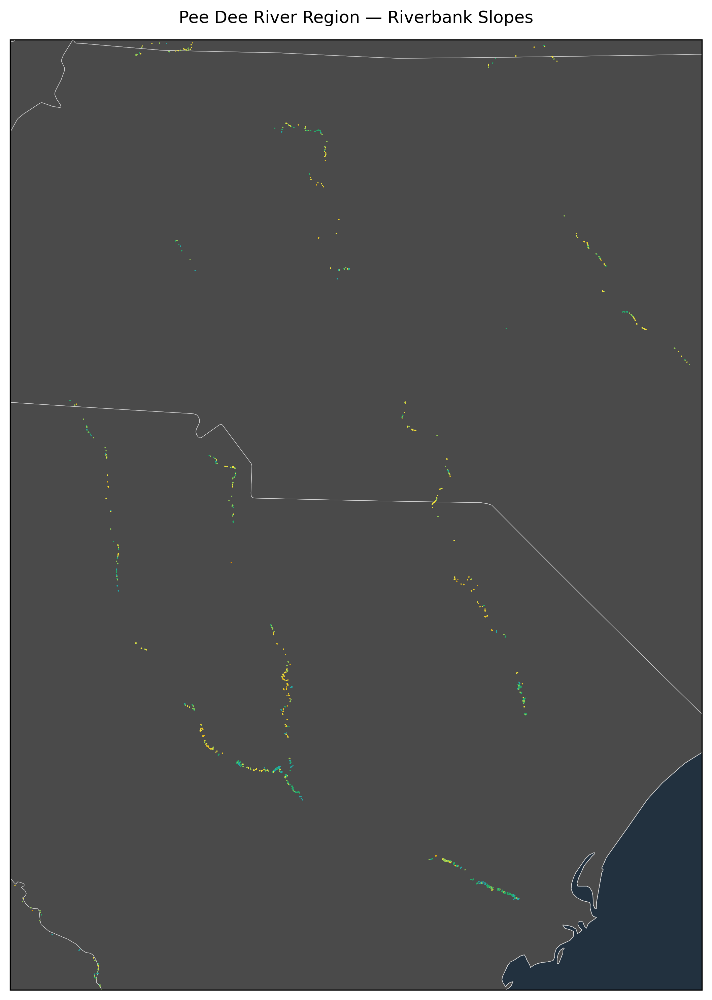

In [5]:
warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------------- CONFIG ----------------
CSV_GLOB   = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
LAT_COL, LON_COL, VAL_COL = "lat", "lon", "slope1"

# Pee Dee River region (lon_min, lon_max, lat_min, lat_max)
# Covers Yadkin headwaters -> Pee Dee -> Winyah Bay (Georgetown, SC)
PD_BBOX = (-81.9, -78.7, 32.9, 36.6)

FIGSIZE     = (10, 10)
POINT_SIZE  = 0.5
ALPHA       = 0.9
MIN_SLOPE   = 1e-4
MAX_SLOPE   = 1.0

BREAKS = np.array([0.0001,0.002,0.005,0.01,0.02,0.05,0.1,0.2,0.4,0.6,1.0])
COLOR_GAMMA = 0.65

# ---------------- PALETTE ----------------
def okabe_ito_cont():
    return LinearSegmentedColormap.from_list(
        "okabe_ito_cont",
        ["#56B4E9","#009E73","#F0E442","#E69F00","#D55E00"], N=256)

cmap_cont = okabe_ito_cont()
n_bins = len(BREAKS) - 1
centers = (np.arange(n_bins) + 0.5) / n_bins
centers_gamma = np.clip(centers,0,1)**COLOR_GAMMA
cmap = ListedColormap([cmap_cont(c) for c in centers_gamma], name="hybridmap")
norm = BoundaryNorm(BREAKS, ncolors=cmap.N, clip=True)

# ---------------- LOAD DATA ----------------
files = sorted(glob.glob(CSV_GLOB))
dfs=[]
for f in files:
    try:
        df = pd.read_csv(f, usecols=[LAT_COL, LON_COL, VAL_COL])
        dfs.append(df.dropna(subset=[LAT_COL, LON_COL, VAL_COL]))
    except Exception:
        pass

data = pd.concat(dfs, ignore_index=True)
data = data[(data[VAL_COL] >= MIN_SLOPE) & (data[VAL_COL] <= MAX_SLOPE)].copy()

lon0, lon1, lat0, lat1 = PD_BBOX
region = data[(data[LON_COL] >= lon0) & (data[LON_COL] <= lon1) &
              (data[LAT_COL] >= lat0) & (data[LAT_COL] <= lat1)].reset_index(drop=True)
vals = region[VAL_COL].to_numpy()
print(f"✅ Pee Dee region rows: {len(region):,}")

# ---------------- FIGURE ----------------
# Albers Equal Area tuned for the Carolinas / Pee Dee basin
proj = ccrs.AlbersEqualArea(central_longitude=-80.5, central_latitude=34.8,
                            standard_parallels=(33.0, 36.5))
pc   = ccrs.PlateCarree()

plt.figure(figsize=FIGSIZE, dpi=300, facecolor="none")
ax = plt.axes(projection=proj)
ax.set_extent([lon0, lon1, lat0, lat1], crs=pc)

ax.set_facecolor("none")
ax.add_feature(cfeature.LAND,  facecolor="#4a4a4a", edgecolor="none", zorder=0)
ax.add_feature(cfeature.OCEAN, facecolor="#22313f", edgecolor="none", zorder=0)
ax.coastlines("10m", linewidth=0.4, color="white", zorder=1)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="lightgray", zorder=1)
ax.add_feature(cfeature.STATES, linewidth=0.3, edgecolor="lightgray", zorder=1)

ax.scatter(region[LON_COL], region[LAT_COL],
           c=vals, s=POINT_SIZE, cmap=cmap, norm=norm,
           transform=pc, alpha=ALPHA, linewidths=0, rasterized=True, zorder=2)

# ----------------
ax.set_title("Pee Dee River Region — Riverbank Slopes", pad=12, color="black")
plt.tight_layout()
plt.show()


✅ Loaded 35,783,661 slope values within [0.0001, 1.0]
📈 min: 0.0001004661974554 | median: 0.0103043502091933 | 95th pct: 0.0592494453496809 | max: 0.9983769580523496
Skew (Fisher–Pearson): 6.668
Skew (Bowley, robust): 0.335
Interpretation: right-skewed (long right tail)


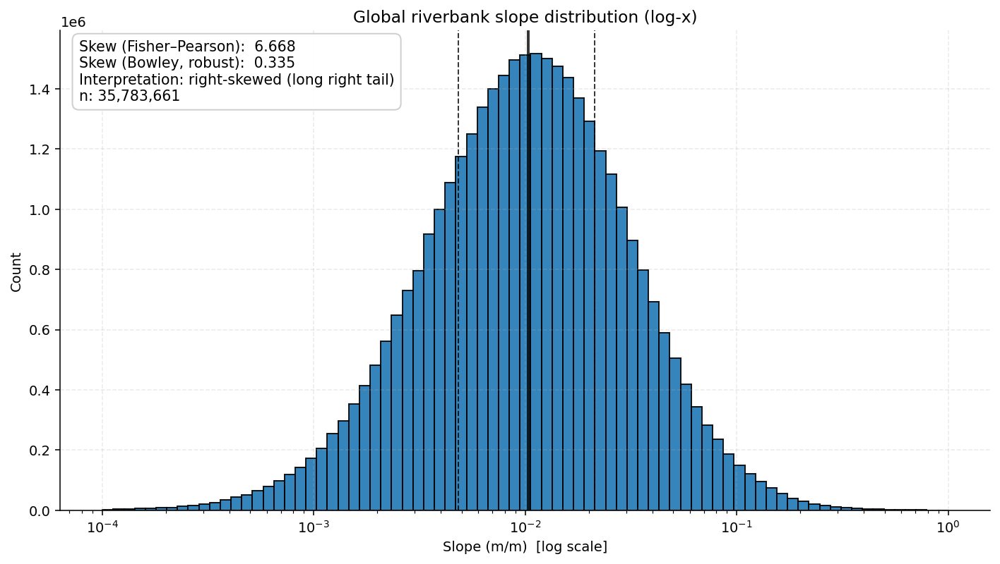

In [6]:
# --- deps (conda):
# conda install -c conda-forge matplotlib pandas numpy

import glob, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------- CONFIG ----------
CSV_GLOB = "/Volumes/Science_SSD/Dissertation/3_output/Global_22_07_25/simple/*.csv"
VAL_COL  = "slope1"

LOWER_BOUND = 1e-4       # ignore <0.0001  (essentially flat / noise)
UPPER_BOUND = 1.0        # ignore >1.0     (>45° → cliffs)
BINS_LOG    = 80         # # of bins for log hist
TITLE       = "Global riverbank slope distribution (log-x)"
# -----------------------------

# ---------- HELPERS ----------
def fisher_pearson_skew(x: np.ndarray) -> float:
    """
    Bias-corrected Fisher–Pearson sample skewness (no SciPy required).
    """
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    n = x.size
    if n < 3:
        return np.nan
    mean = x.mean()
    m2 = np.mean((x - mean)**2)
    m3 = np.mean((x - mean)**3)
    if m2 <= 0:
        return np.nan
    g1 = m3 / (m2 ** 1.5)
    # small-sample correction to match scipy.stats.skew(..., bias=False)
    return (np.sqrt(n*(n-1)) / (n-2)) * g1

def bowley_skew(x: np.ndarray) -> float:
    """
    Bowley (quartile) skewness: (Q3 + Q1 - 2*Q2)/(Q3 - Q1), robust to outliers.
    """
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if x.size < 4:
        return np.nan
    q1, q2, q3 = np.percentile(x, [25, 50, 75])
    iqr = q3 - q1
    return np.nan if iqr == 0 else (q3 + q1 - 2*q2) / iqr

def interpret_skew(s: float, thr: float = 0.25) -> str:
    if not np.isfinite(s):
        return "insufficient data"
    if s > thr:
        return "right-skewed (long right tail)"
    if s < -thr:
        return "left-skewed (long left tail)"
    return "roughly symmetric"
# -----------------------------

# ---------- LOAD + FILTER ----------
files = sorted(glob.glob(CSV_GLOB))
if not files:
    raise FileNotFoundError(f"No CSVs matched: {CSV_GLOB}")

dfs = []
for f in files:
    try:
        df = pd.read_csv(f, usecols=[VAL_COL])
        dfs.append(df)
    except Exception as e:
        print(f"⚠️ Skipped {f}: {e}")

data = pd.concat(dfs, ignore_index=True)
slope = pd.to_numeric(data[VAL_COL], errors="coerce").dropna()

# Filter to plausible range
slope = slope[(slope >= LOWER_BOUND) & (slope <= UPPER_BOUND)]
print(f"✅ Loaded {len(slope):,} slope values within [{LOWER_BOUND}, {UPPER_BOUND}]")

# ---------- BASIC STATS ----------
print("📈 min:", slope.min(),
      "| median:", slope.median(),
      "| 95th pct:", slope.quantile(0.95),
      "| max:", slope.max())

# ---------- SKEWNESS METRICS ----------
sk_fisher = fisher_pearson_skew(slope.values)
sk_bowley = bowley_skew(slope.values)
interp    = interpret_skew(sk_fisher)

print(f"Skew (Fisher–Pearson): {sk_fisher:.3f}")
print(f"Skew (Bowley, robust): {sk_bowley:.3f}")
print(f"Interpretation: {interp}")

# ---------- LOG-X HISTOGRAM (single plot) ----------
# log-spaced bins across observed range (respecting LOWER_BOUND already applied)
xmin = max(LOWER_BOUND, slope.min())
xmax = slope.max()
if not np.isfinite(xmin) or not np.isfinite(xmax) or xmin <= 0 or xmax <= xmin:
    raise ValueError("Invalid slope range for log histogram.")

log_bins = np.logspace(np.log10(xmin), np.log10(xmax), BINS_LOG)

plt.rcParams.update({
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "grid.linestyle": "--",
})

fig, ax = plt.subplots(figsize=(10, 5.6), dpi=140, constrained_layout=True)

# Histogram (counts; change to density=True if you prefer PDFs)
ax.hist(slope, bins=log_bins, edgecolor="black", alpha=0.9)

# Quartile markers
q1, q2, q3 = np.percentile(slope, [25, 50, 75])
for val, lw, ls in [(q2, 2.0, "-"), (q1, 1.0, "--"), (q3, 1.0, "--")]:
    ax.axvline(val, lw=lw, ls=ls, color="black", alpha=0.8)

# Axis + labels
ax.set_xscale("log")
ax.set_xlabel("Slope (m/m)  [log scale]")
ax.set_ylabel("Count")
ax.set_title(TITLE)

# Annotation box with metrics
note = (
    f"Skew (Fisher–Pearson): {sk_fisher: .3f}\n"
    f"Skew (Bowley, robust): {sk_bowley: .3f}\n"
    f"Interpretation: {interp}\n"
    f"n: {len(slope):,}"
)
ax.text(
    0.02, 0.98, note,
    transform=ax.transAxes, va="top", ha="left",
    bbox=dict(boxstyle="round,pad=0.45", fc="white", ec="0.8", alpha=0.95),
    fontsize=10.5
)

plt.show()


In [7]:
mean = slope.mean()
median = slope.median()
print(f"mean={mean:.6g}, median={median:.6g}",
      "→ right-skewed" if mean > median else "→ left-skewed" if mean < median else "→ roughly symmetric")


mean=0.0181719, median=0.0103044 → right-skewed


✅ Loaded 20,570 slope values within [0.0001, 1.0]
📈 min: 0.0009158502592621 | median: 0.0180664041154428 | 95th pct: 0.049892470539905 | max: 0.2049447860494306
Skew (Fisher–Pearson): 4.024
Skew (Bowley, robust): 0.194
Interpretation: right-skewed (long right tail)


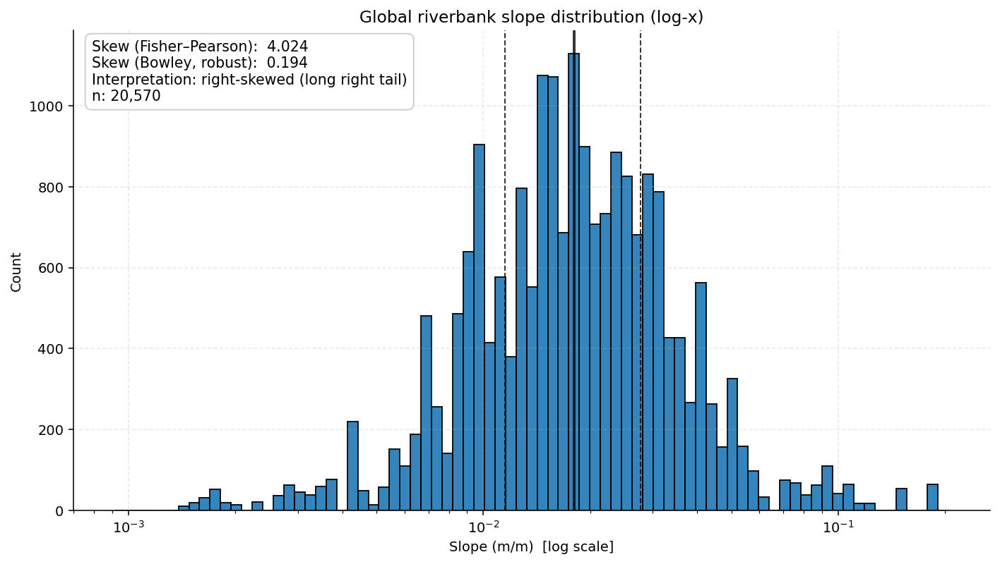

In [18]:
# --- deps (conda):
# conda install -c conda-forge matplotlib pandas numpy

import glob, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------- CONFIG ----------
CSV_GLOB = "/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/All/*.csv"
VAL_COL  = "slope1"

LOWER_BOUND = 1e-4       # ignore <0.0001  (essentially flat / noise)
UPPER_BOUND = 1.0        # ignore >1.0     (>45° → cliffs)
BINS_LOG    = 80         # # of bins for log hist
TITLE       = "Global riverbank slope distribution (log-x)"
# -----------------------------

# ---------- HELPERS ----------
def fisher_pearson_skew(x: np.ndarray) -> float:
    """
    Bias-corrected Fisher–Pearson sample skewness (no SciPy required).
    """
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    n = x.size
    if n < 3:
        return np.nan
    mean = x.mean()
    m2 = np.mean((x - mean)**2)
    m3 = np.mean((x - mean)**3)
    if m2 <= 0:
        return np.nan
    g1 = m3 / (m2 ** 1.5)
    # small-sample correction to match scipy.stats.skew(..., bias=False)
    return (np.sqrt(n*(n-1)) / (n-2)) * g1

def bowley_skew(x: np.ndarray) -> float:
    """
    Bowley (quartile) skewness: (Q3 + Q1 - 2*Q2)/(Q3 - Q1), robust to outliers.
    """
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if x.size < 4:
        return np.nan
    q1, q2, q3 = np.percentile(x, [25, 50, 75])
    iqr = q3 - q1
    return np.nan if iqr == 0 else (q3 + q1 - 2*q2) / iqr

def interpret_skew(s: float, thr: float = 0.25) -> str:
    if not np.isfinite(s):
        return "insufficient data"
    if s > thr:
        return "right-skewed (long right tail)"
    if s < -thr:
        return "left-skewed (long left tail)"
    return "roughly symmetric"
# -----------------------------

# ---------- LOAD + FILTER ----------
files = sorted(glob.glob(CSV_GLOB))
if not files:
    raise FileNotFoundError(f"No CSVs matched: {CSV_GLOB}")

dfs = []
for f in files:
    try:
        df = pd.read_csv(f, usecols=[VAL_COL])
        dfs.append(df)
    except Exception as e:
        print(f"⚠️ Skipped {f}: {e}")

data = pd.concat(dfs, ignore_index=True)
slope = pd.to_numeric(data[VAL_COL], errors="coerce").dropna()

# Filter to plausible range
slope = slope[(slope >= LOWER_BOUND) & (slope <= UPPER_BOUND)]
print(f"✅ Loaded {len(slope):,} slope values within [{LOWER_BOUND}, {UPPER_BOUND}]")

# ---------- BASIC STATS ----------
print("📈 min:", slope.min(),
      "| median:", slope.median(),
      "| 95th pct:", slope.quantile(0.95),
      "| max:", slope.max())

# ---------- SKEWNESS METRICS ----------
sk_fisher = fisher_pearson_skew(slope.values)
sk_bowley = bowley_skew(slope.values)
interp    = interpret_skew(sk_fisher)

print(f"Skew (Fisher–Pearson): {sk_fisher:.3f}")
print(f"Skew (Bowley, robust): {sk_bowley:.3f}")
print(f"Interpretation: {interp}")

# ---------- LOG-X HISTOGRAM (single plot) ----------
# log-spaced bins across observed range (respecting LOWER_BOUND already applied)
xmin = max(LOWER_BOUND, slope.min())
xmax = slope.max()
if not np.isfinite(xmin) or not np.isfinite(xmax) or xmin <= 0 or xmax <= xmin:
    raise ValueError("Invalid slope range for log histogram.")

log_bins = np.logspace(np.log10(xmin), np.log10(xmax), BINS_LOG)

plt.rcParams.update({
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "grid.linestyle": "--",
})

fig, ax = plt.subplots(figsize=(10, 5.6), dpi=140, constrained_layout=True)

# Histogram (counts; change to density=True if you prefer PDFs)
ax.hist(slope, bins=log_bins, edgecolor="black", alpha=0.9)

# Quartile markers
q1, q2, q3 = np.percentile(slope, [25, 50, 75])
for val, lw, ls in [(q2, 2.0, "-"), (q1, 1.0, "--"), (q3, 1.0, "--")]:
    ax.axvline(val, lw=lw, ls=ls, color="black", alpha=0.8)

# Axis + labels
ax.set_xscale("log")
ax.set_xlabel("Slope (m/m)  [log scale]")
ax.set_ylabel("Count")
ax.set_title(TITLE)

# Annotation box with metrics
note = (
    f"Skew (Fisher–Pearson): {sk_fisher: .3f}\n"
    f"Skew (Bowley, robust): {sk_bowley: .3f}\n"
    f"Interpretation: {interp}\n"
    f"n: {len(slope):,}"
)
ax.text(
    0.02, 0.98, note,
    transform=ax.transAxes, va="top", ha="left",
    bbox=dict(boxstyle="round,pad=0.45", fc="white", ec="0.8", alpha=0.95),
    fontsize=10.5
)

plt.show()


⚠️ Skipped /Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/All/Sacramento_bath_reg_bottom_error_simple.csv: Usecols do not match columns, columns expected but not found: ['slope1']
✅ Loaded SWOT (non-bathy): 20,570
✅ Loaded Bathymetry: 9,023


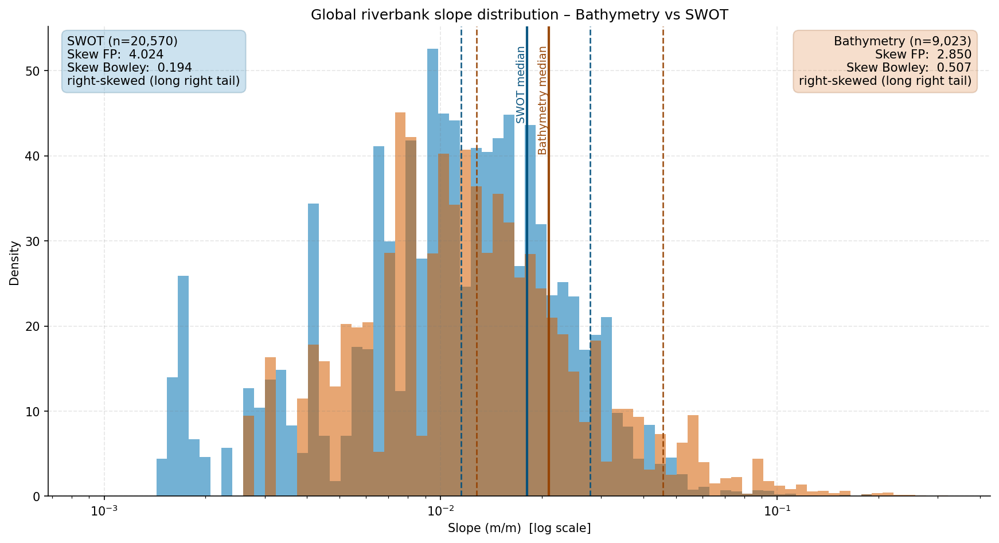

In [29]:
import glob, warnings, os
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore", category=RuntimeWarning)

# ---------- CONFIG ----------
CSV_GLOB = "/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/All/*.csv"

VAL_COL_MAIN   = "slope1"          # for non-bathy CSVs
VAL_COL_BATHY1 = "slope_bathy"     # preferred bathy column
VAL_COL_BATHY2 = "slople_bathy"    # tolerate typo if present

LOWER_BOUND = 1e-4
UPPER_BOUND = 1.0
BINS_LOG    = 80
TITLE       = "Global riverbank slope distribution – Bathymetry vs SWOT"

# --- Visual style ---
FILL_COLOR_MAIN  = "#0072B2"   # SWOT
FILL_COLOR_BATHY = "#D55E00"   # Bathymetry
FILL_ALPHA_MAIN  = 0.55
FILL_ALPHA_BATHY = 0.55
EDGE_LINEWIDTH   = 0.0
EDGE_COLOR       = "none"

GRID_ALPHA   = 0.18
GRID_COLOR   = "#777777"
AX_FACE      = "white"
FIG_FACE     = "white"

# Inset box styling (backgrounds use histogram colors)
BOX_ALPHA    = 0.20
BOX_EDGE_DARKEN = 0.65
TEXT_COLOR_FORCE = "black"   # force all inset text to black
# -----------------------------

# ---------- HELPERS ----------
def fisher_pearson_skew(x: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    n = x.size
    if n < 3:
        return np.nan
    mean = x.mean()
    m2 = np.mean((x - mean)**2)
    m3 = np.mean((x - mean)**3)
    if m2 <= 0:
        return np.nan
    g1 = m3 / (m2 ** 1.5)
    return (np.sqrt(n*(n-1)) / (n-2)) * g1

def bowley_skew(x: np.ndarray) -> float:
    x = np.asarray(x, dtype=float)
    x = x[np.isfinite(x)]
    if x.size < 4:
        return np.nan
    q1, q2, q3 = np.percentile(x, [25, 50, 75])
    iqr = q3 - q1
    return np.nan if iqr == 0 else (q3 + q1 - 2*q2) / iqr

def interpret_skew(s: float, thr: float = 0.25) -> str:
    if not np.isfinite(s):
        return "insufficient data"
    if s > thr:
        return "right-skewed (long right tail)"
    if s < -thr:
        return "left-skewed (long left tail)"
    return "roughly symmetric"

def _coerce_and_clip(series: pd.Series) -> pd.Series:
    s = pd.to_numeric(series, errors="coerce").dropna()
    return s[(s >= LOWER_BOUND) & (s <= UPPER_BOUND)]

def darken(hex_color, factor=0.70):
    hc = hex_color.lstrip("#")
    r, g, b = (int(hc[i:i+2], 16) for i in (0, 2, 4))
    r = int(r * factor); g = int(g * factor); b = int(b * factor)
    return f"#{r:02X}{g:02X}{b:02X}"
# -----------------------------

# ---------- PARTITION FILES ----------
files = sorted(glob.glob(CSV_GLOB))
if not files:
    raise FileNotFoundError(f"No CSVs matched: {CSV_GLOB}")

files_bathy = [f for f in files if "bathy" in os.path.basename(f).lower()]
files_main  = [f for f in files if f not in files_bathy]

# ---------- LOAD DATA ----------
def load_group(files, which: str) -> pd.Series:
    vals = []
    for f in files:
        try:
            if which == "main":
                df = pd.read_csv(f, usecols=[VAL_COL_MAIN])
                vals.append(df[VAL_COL_MAIN])
            else:  # bathy
                try:
                    df = pd.read_csv(f, usecols=[VAL_COL_BATHY1])
                    vals.append(df[VAL_COL_BATHY1])
                except Exception:
                    df = pd.read_csv(f, usecols=[VAL_COL_BATHY2])
                    vals.append(df[VAL_COL_BATHY2])
        except Exception as e:
            print(f"⚠️ Skipped {f}: {e}")
    if not vals:
        return pd.Series([], dtype=float)
    return pd.concat(vals, ignore_index=True)

s_main_raw  = load_group(files_main,  "main")
s_bathy_raw = load_group(files_bathy, "bathy")

s_main  = _coerce_and_clip(s_main_raw)
s_bathy = _coerce_and_clip(s_bathy_raw)

n_main, n_bathy = len(s_main), len(s_bathy)
print(f"✅ Loaded SWOT (non-bathy): {n_main:,}")
print(f"✅ Loaded Bathymetry: {n_bathy:,}")

# ---------- STATS + SKEW ----------
def report(name, s):
    if len(s) == 0:
        return np.nan, np.nan, "insufficient data"
    sk_f = fisher_pearson_skew(s.values)
    sk_b = bowley_skew(s.values)
    interp = interpret_skew(sk_f)
    return sk_f, sk_b, interp

sk_f_main,  sk_b_main,  interp_main  = report("SWOT (non-bathy)", s_main)
sk_f_bathy, sk_b_bathy, interp_bathy = report("Bathymetry", s_bathy)

# ---------- SHARED LOG BINS ----------
all_pos = pd.concat([s for s in [s_main, s_bathy] if len(s) > 0])
xmin = max(LOWER_BOUND, all_pos.min())
xmax = all_pos.max()
log_bins = np.logspace(np.log10(xmin), np.log10(xmax), BINS_LOG)

# ---------- PLOT ----------
mpl.rcParams.update({
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.facecolor": AX_FACE,
    "figure.facecolor": FIG_FACE,
    "axes.grid": True,
    "grid.alpha": GRID_ALPHA,
    "grid.color": GRID_COLOR,
    "grid.linestyle": "--",
})

fig, ax = plt.subplots(figsize=(11.5, 6.2), dpi=150, constrained_layout=True)

if n_main > 0:
    ax.hist(
        s_main, bins=log_bins, density=True,
        alpha=FILL_ALPHA_MAIN, color=FILL_COLOR_MAIN,
        edgecolor=EDGE_COLOR, linewidth=EDGE_LINEWIDTH,
        label="SWOT"
    )
if n_bathy > 0:
    ax.hist(
        s_bathy, bins=log_bins, density=True,
        alpha=FILL_ALPHA_BATHY, color=FILL_COLOR_BATHY,
        edgecolor=EDGE_COLOR, linewidth=EDGE_LINEWIDTH,
        label="Bathymetry"
    )

# Quartile/median markers
def add_markers(s, color, label_prefix):
    if len(s) == 0: return
    q1, q2, q3 = np.percentile(s, [25, 50, 75])
    c = darken(color, 0.7)
    ax.axvline(q2, lw=2.0, ls="-",  color=c, alpha=0.95)
    ax.axvline(q1, lw=1.3, ls="--", color=c, alpha=0.9)
    ax.axvline(q3, lw=1.3, ls="--", color=c, alpha=0.9)
    ax.text(q2, ax.get_ylim()[1]*0.96, f"{label_prefix} median",
            rotation=90, va="top", ha="right", fontsize=9.2, color=c, alpha=0.95)

if n_main > 0:
    add_markers(s_main,  FILL_COLOR_MAIN,  "SWOT")
if n_bathy > 0:
    add_markers(s_bathy, FILL_COLOR_BATHY, "Bathymetry")

ax.set_xscale("log")
ax.set_xlabel("Slope (m/m)  [log scale]")
ax.set_ylabel("Density")
ax.set_title(TITLE)

# --- Colored insets with black font ---
def annotate_box(xpos, text, fill_hex):
    edge_hex = darken(fill_hex, BOX_EDGE_DARKEN)
    ax.text(
        xpos, 0.98, text, transform=ax.transAxes,
        va="top", ha="left" if xpos < 0.5 else "right",
        bbox=dict(boxstyle="round,pad=0.45",
                  fc=fill_hex, ec=edge_hex, alpha=BOX_ALPHA),
        fontsize=10.2, color=TEXT_COLOR_FORCE
    )

if n_main > 0:
    txt_main = (
        f"SWOT (n={n_main:,})\n"
        f"Skew FP: {sk_f_main: .3f}\n"
        f"Skew Bowley: {sk_b_main: .3f}\n"
        f"{interp_main}"
    )
    annotate_box(0.02, txt_main, FILL_COLOR_MAIN)

if n_bathy > 0:
    txt_bathy = (
        f"Bathymetry (n={n_bathy:,})\n"
        f"Skew FP: {sk_f_bathy: .3f}\n"
        f"Skew Bowley: {sk_b_bathy: .3f}\n"
        f"{interp_bathy}"
    )
    annotate_box(0.98, txt_bathy, FILL_COLOR_BATHY)

plt.show()
# ==================== END FULL SCRIPT ====================



In [30]:
# ---------- SAVE AS 600-DPI PNG ----------
OUT_PNG = "/Users/daniel/Documents/UNC/Presentations/SWOT25/Poster/riverbank_val_histogram_600dpi.png"

fig.savefig(
    OUT_PNG,
    dpi=600,                 # export resolution
    facecolor="white",       # keeps white background
    bbox_inches="tight",     # trims surrounding whitespace
    pad_inches=0.05          # small padding so labels don’t get clipped
)

print(f"✅ Histogram saved at 600 DPI → {OUT_PNG}")



✅ Histogram saved at 600 DPI → /Users/daniel/Documents/UNC/Presentations/SWOT25/Poster/riverbank_val_histogram_600dpi.png


✔ Cleaned → /Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/Per_river_stats_accumulated__clean.csv
✅ Saved → /Users/daniel/Documents/UNC/Presentations/SWOT25/Poster/per_river_corr_with_IQR.png (DPI=600, alpha=0.75)


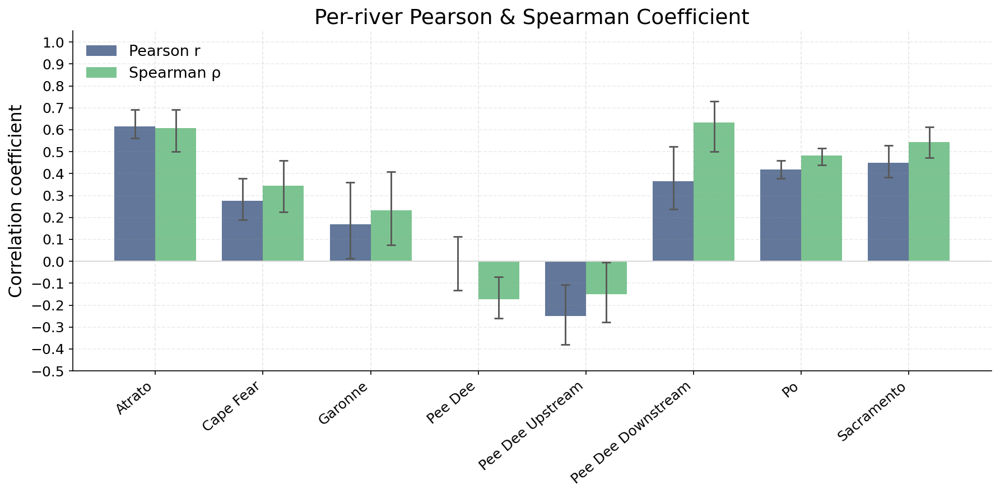

In [56]:
# ===================== Clean CSV (dedupe headers) + Barplot with IQR whiskers =====================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

# ---------- PATHS ----------
CSV_IN    = "/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/Per_river_stats_accumulated_Vok.csv"
CSV_CLEAN = "/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/Per_river_stats_accumulated__clean.csv"
OUT_PNG   = "/Users/daniel/Documents/UNC/Presentations/SWOT25/Poster/per_river_corr_with_IQR.png"
DPI_SAVE  = 600

# ---------- Expected schema ----------
EXPECTED_COLS = [
    "river","n",
    "pearson_r","pearson_p",
    "spearman_rho","spearman_p",
    "pearson_q1","pearson_q2","pearson_q3","pearson_iqr",
    "spearman_q1","spearman_q2","spearman_q3","spearman_iqr",
    "mae","rmse","bias_mean_%","mare_%",
    "abs_rel_q1_%","abs_rel_q3_%","abs_rel_iqr_%"
]

# ---------- 1) CLEAN CSV ----------
def clean_csv(infile: str, outfile: str) -> None:
    if not os.path.isfile(infile):
        raise FileNotFoundError(infile)
    with open(infile, "r") as f:
        lines = [ln for ln in f.readlines() if ln.strip() != ""]
    if not lines:
        raise ValueError("Input CSV is empty.")

    first = lines[0].strip()
    has_header = first.lower().startswith("river,")
    if has_header:
        header = lines[0]
        body = []
        for ln in lines[1:]:
            if ln.strip().lower().startswith("river,"):
                continue
            body.append(ln)
        with open(outfile, "w") as g:
            g.write(header)
            g.writelines(body)
    else:
        with open(outfile, "w") as g:
            g.writelines(lines)
    print(f"✔ Cleaned → {outfile}")

clean_csv(CSV_IN, CSV_CLEAN)

# ---------- 2) LOAD CSV ----------
def load_stats(csv_path: str) -> pd.DataFrame:
    try:
        df0 = pd.read_csv(csv_path)
        need = {"river","pearson_r","spearman_rho","pearson_q1","pearson_q3","spearman_q1","spearman_q3"}
        have = set([c.strip() for c in df0.columns])
        if need.issubset(have):
            df0.columns = [c.strip() for c in df0.columns]
            return df0
        df1 = pd.read_csv(csv_path, header=None, names=EXPECTED_COLS)
        return df1
    except Exception:
        df1 = pd.read_csv(csv_path, header=None, names=EXPECTED_COLS)
        return df1

df = load_stats(CSV_CLEAN)
df = df.drop_duplicates(subset="river", keep="last").reset_index(drop=True)

# ---- REVERSE the order so the last river appears first
df = df.iloc[::-1].reset_index(drop=True)

# numeric coercion
for col in ["pearson_r","spearman_rho","pearson_q1","pearson_q3","spearman_q1","spearman_q3"]:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors="coerce")

required = ["river","pearson_r","spearman_rho","pearson_q1","pearson_q3","spearman_q1","spearman_q3"]
df = df.dropna(subset=[c for c in required if c in df.columns])
if df.empty:
    raise ValueError("No valid rows to plot after cleaning.")

# ---------- 3) PLOT ----------
rivers       = df["river"].astype(str).tolist()
pearson_med  = df["pearson_r"].to_numpy()
spearman_med = df["spearman_rho"].to_numpy()
pearson_q1   = df["pearson_q1"].to_numpy()
pearson_q3   = df["pearson_q3"].to_numpy()
spearman_q1  = df["spearman_q1"].to_numpy()
spearman_q3  = df["spearman_q3"].to_numpy()

pearson_yerr  = np.vstack([np.maximum(0, pearson_med - pearson_q1),
                           np.maximum(0, pearson_q3 - pearson_med)])
spearman_yerr = np.vstack([np.maximum(0, spearman_med - spearman_q1),
                           np.maximum(0, spearman_q3 - spearman_med)])

x = np.arange(len(rivers))
bar_w = 0.38
c_pearson  = "#2E4A78"
c_spearman = "#4FB06D"
alpha = 0.75

# ---- Larger fonts ----
plt.rcParams.update({
    "axes.titlesize": 18,
    "axes.labelsize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 13
})

fig, ax = plt.subplots(figsize=(max(12, 0.6*len(rivers)+2), 6), dpi=150)

ax.bar(x - bar_w/2, pearson_med,  width=bar_w, color=c_pearson,  alpha=alpha, label="Pearson r")
ax.bar(x + bar_w/2, spearman_med, width=bar_w, color=c_spearman, alpha=alpha, label="Spearman ρ")

ax.errorbar(x - bar_w/2, pearson_med,  yerr=pearson_yerr,  fmt="none",
            ecolor="0.35", elinewidth=1.4, capsize=4, capthick=1.4, zorder=3)
ax.errorbar(x + bar_w/2, spearman_med, yerr=spearman_yerr, fmt="none",
            ecolor="0.35", elinewidth=1.4, capsize=4, capthick=1.4, zorder=3)

lowest = np.nanmin([pearson_med.min(), spearman_med.min(),
                    pearson_q1.min(), spearman_q1.min()])
low_margin = np.floor((min(lowest, 0) - 0.1) * 10) / 10.0
if not np.isfinite(low_margin):
    low_margin = -0.2
ax.set_ylim(low_margin, 1.05)

ax.yaxis.set_major_locator(mticker.MultipleLocator(0.1))
ax.set_xticks(x)
ax.set_xticklabels(rivers, rotation=40, ha="right")
ax.set_ylabel("Correlation coefficient")
ax.axhline(0, color="0.85", lw=1)
ax.grid(axis="y", alpha=0.18, color="0.6", linestyle="--")
ax.legend(frameon=False, loc="upper left")
ax.set_title("Per-river Pearson & Spearman Coefficient")

fig.tight_layout()
fig.savefig(OUT_PNG, dpi=DPI_SAVE, bbox_inches="tight", facecolor="white")
print(f"✅ Saved → {OUT_PNG} (DPI={DPI_SAVE}, alpha={alpha})")



✔ Cleaned → /Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/Per_river_stats_accumulated__clean.csv


/var/folders/fg/t6lktxg91c5b91pyb0rk6x080000gn/T/ipykernel_49955/3045288618.py:74: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


✔ Saved figure → /Users/daniel/Documents/UNC/Presentations/SWOT25/Poster/per_river_bias_and_p68.png  (DPI=600)


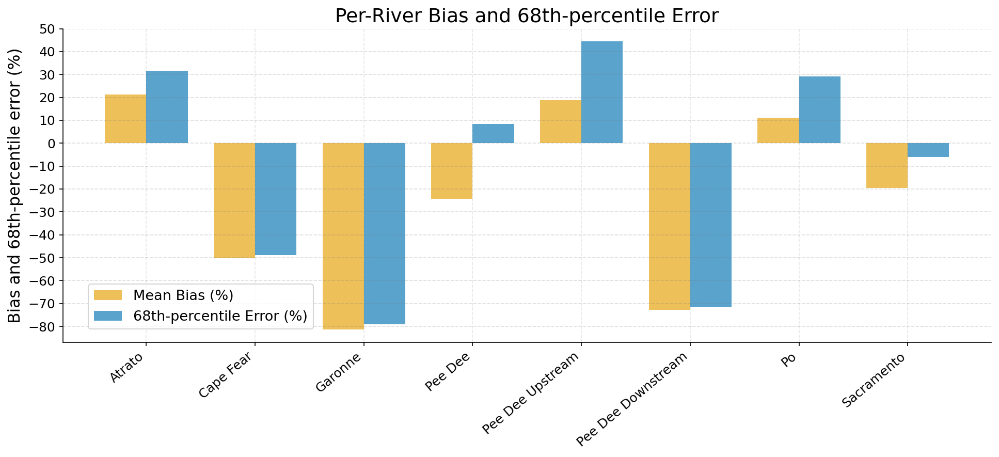

In [61]:
# ===================  BARPLOT: Bias (%) and 68th-percentile error (%) ===================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------- PATHS ----------
CSV_IN    = "/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/Per_river_stats_accumulated_Vok.csv"
CSV_CLEAN = "/Volumes/Science_SSD/Dissertation/2_intermediate/Store/Validation/csv/Per_river_stats_accumulated__clean.csv"
OUT_PNG   = "/Users/daniel/Documents/UNC/Presentations/SWOT25/Poster/per_river_bias_and_p68.png"
DPI_SAVE  = 600

# ---------- CLEAN CSV ----------
df = pd.read_csv(CSV_IN)
df = df[df["river"] != "river"].copy()       # drop duplicate header rows
df.to_csv(CSV_CLEAN, index=False)
print(f"✔ Cleaned → {CSV_CLEAN}")

# ---------- LOAD CLEAN ----------
df = pd.read_csv(CSV_CLEAN)

# ---- REVERSE ORDER so last river in CSV appears first in the plot
df = df.iloc[::-1].reset_index(drop=True)

rivers    = df["river"].tolist()
bias_mean = df["bias_mean_%"].astype(float).values
rel_p68   = df["rel_p68_%"].astype(float).values

# ---------- PLOT ----------
plt.rcParams.update({
    "axes.titlesize": 18,
    "axes.labelsize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 13
})

fig, ax = plt.subplots(figsize=(13, 6), dpi=150, constrained_layout=True)

x = np.arange(len(rivers))
bar_w = 0.38

# Color-blind palette (Okabe–Ito)
c_bias = "#E69F00"    # orange
c_p68  = "#0072B2"    # blue

ax.bar(x - bar_w/2, bias_mean, width=bar_w, color=c_bias, alpha=0.65, label="Mean Bias (%)")
ax.bar(x + bar_w/2, rel_p68,   width=bar_w, color=c_p68, alpha=0.65, label="68th-percentile Error (%)")

# Axis labels / ticks
ax.set_xticks(x)
ax.set_xticklabels(rivers, rotation=40, ha="right")
ax.set_ylabel("Bias and 68th-percentile error (%)")
ax.set_title("Per-River Bias and 68th-percentile Error")

# Vertical limits with margin
y_min = np.nanmin([bias_mean.min(), rel_p68.min()])
y_max = np.nanmax([bias_mean.max(), rel_p68.max()])
ax.set_ylim(np.floor(y_min - 5), np.ceil(y_max + 5))

# Grid and tick spacing
ax.yaxis.set_major_locator(plt.MultipleLocator(10))
ax.grid(axis="y", linestyle="--", alpha=0.25)

# ---------- LEGEND: INSIDE the plot, slightly above the Atrato bar
ax.legend(
    frameon=True,
    facecolor="white",
    edgecolor="0.8",
    loc="lower left",       # lower-left corner
    bbox_to_anchor=(0.02, 0.02),  # small inset inside the axes
    fontsize=13
)

plt.tight_layout()

# ---------- SAVE ----------
plt.savefig(OUT_PNG, dpi=DPI_SAVE, bbox_inches="tight", transparent=False)
print(f"✔ Saved figure → {OUT_PNG}  (DPI={DPI_SAVE})")

plt.show()

